## Self created graing and the fft

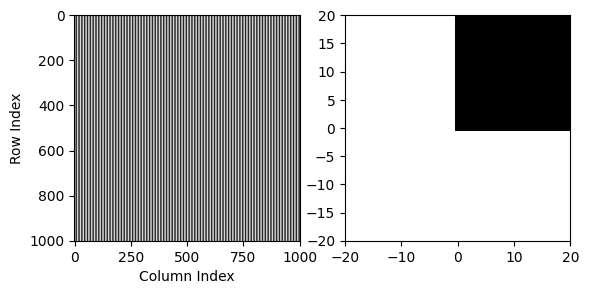

In [1]:
# gratings.py

import numpy as np
import matplotlib.pyplot as plt

x = np.arange(0, 1001, 1)
X, Y = np.meshgrid(x, x) #create 2D grid array according to X
wavelength = 1000/80
angle = 0
grating = np.sin(2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength) #2D array
plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(grating) #the starting point for grating doesn't matter anymore
plt.xlabel('Column Index')
plt.ylabel('Row Index')

# Calculate Fourier transform of grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
#ft = np.fft.fftshift(ft) #keep the frequency as it is. no shift

plt.subplot(122)
plt.imshow(abs(ft))
s=1
#plt.imshow(abs(ft), extent=[-ft.shape[1]*s, ft.shape[1]*s, -ft.shape[0]*s, ft.shape[0]*s])
plt.imshow(abs(ft), extent=[0, 40, 0, 40])

plt.xlim([-20, 20])
plt.ylim([-20, 20])

#plt.xlim([520, 480])
#plt.ylim([520, 480])  # Note, order is reversed for y

# # Change the x-axis labels
# labels = [item.get_text() for item in plt.gca().get_xticklabels()]
# labels = [str(float(label) / 2) for label in labels]
# plt.xticks(plt.xticks()[0], labels)

# # Change the x-axis labels
# locs, _ = plt.xticks()  # Get the current tick locations
# new_labels = locs / 2  # Compute the new labels
# plt.xticks(locs, new_labels)  # Set the new labels

plt.show()

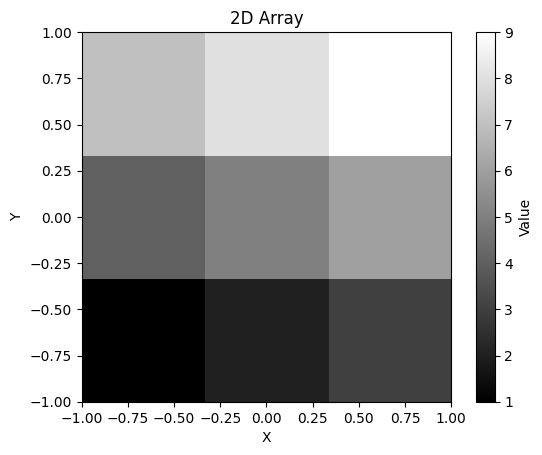

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Create a 2D array
data = np.array([[1, 2, 3],
                 [4, 5, 6],
                 [7, 8, 9]])

# Plot the 2D array
plt.imshow(data, cmap='gray', origin='lower', extent=[-1, 1, -1, 1])
plt.colorbar(label='Value')
plt.title('2D Array')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

## Understand the fft frequency


```
Here's a breakdown of what each line is doing:
ft = np.fft.ifftshift(grating): The np.fft.ifftshift() function undoes the shift operation performed by np.fft.fftshift(). It's used here to shift the zero-frequency component from the center of the spectrum to the corners, which is the format expected by np.fft.fft2().
ft = np.fft.fft2(ft): The np.fft.fft2() function performs a 2D Fast Fourier Transform on the input array. This transforms the data from the spatial domain to the frequency domain.
ft = np.fft.fftshift(ft): The np.fft.fftshift() function shifts the zero-frequency component to the center of the spectrum. This is often done for visualization purposes, as it's more intuitive to see the low frequencies at the center and the high frequencies at the corners.
The result ft is the 2D Fourier Transform of grating, with the zero-frequency component shifted to the center of the spectrum.

```

## Test images

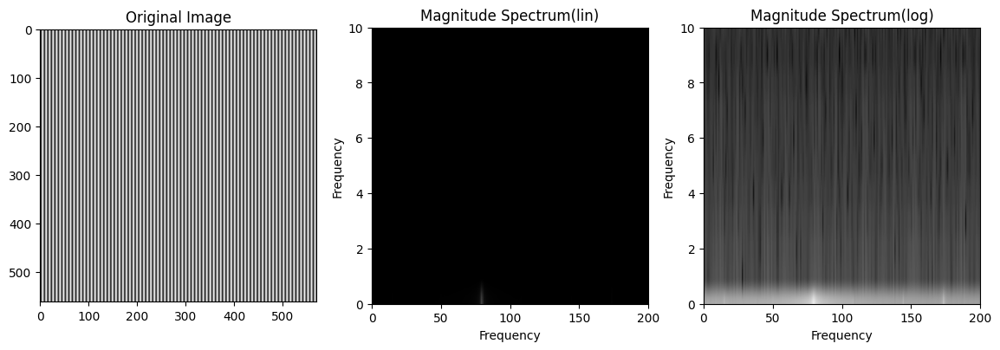

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
# Load the image
#image = Image.open('test2.png').convert('L')
#image=grating
image = cv2.imread('/Users/qingjunwang/Desktop/test.png',cv2.IMREAD_GRAYSCALE)  # Replace with your image file
# Perform the 2D FFT

# Convert the image to numpy array
#image = np.array(image)
f_range=200 #used for fft xy limitation

# Calculate Fourier transform of grating
ft = np.fft.ifftshift(image)
ft = np.fft.fft2(ft)
#ft = np.fft.fftshift(ft)

# # Perform the 2D Fourier Transform
# fourier_transform = np.fft.fft2(image)
# # Shift the zero-frequency component to the center
# fourier_transform_shifted = np.fft.fftshift(fourier_transform)

# Compute the magnitude spectrum
magnitude_spectrum = 20*np.log1p(np.abs(ft))
magnitude_spectrum_lin = 20*(np.abs(ft))

# Display the original image and the magnitude spectrum
plt.figure(figsize=(14, 14))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.xlim([-0, f_range])
plt.ylim([-0, 10])
plt.imshow(magnitude_spectrum_lin, cmap='gray',aspect=f_range/10)
plt.xlabel('Frequency')
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(lin)')

f_range=200
plt.subplot(1, 3, 3)
plt.imshow(magnitude_spectrum, cmap='gray',aspect=f_range/10)
plt.xlabel('Frequency')
plt.xlim([-0, f_range])
plt.ylim([-0, 10])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log)')
plt.show()

# def fft analysis 8um_test1.1 

In [152]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
############################## 
def draw_fft_8um_test11(z):
    ############################################# ^for fewer laser one PIC focus is at: z=0.093mm ; more lasers is at 0.093mm: 
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    # image = Image.open(file).convert('L')
    ########################################
    print('draw_fft_8um_test1.1')
    image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png";# Load the image of fewer laser
    image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png"
    ########################################## ^
    image = Image.open(image_name).convert('L') # Load the image of fewer laser
    image2 = Image.open(image_name2).convert('L')# Load the image of more laser
    
    ft = np.fft.ifftshift(image)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(image2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=177;
    # Display the original image and the magnitude spectrum
    
    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    image = np.array(image)
    image2 = np.array(image2)
    max_value = image.max()
    image = (image / max_value) * 255
    max_value2 = image2.max()
    image2 = (image2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(image, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(image2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    print('z='+str(z-0.093))
    plt.show()
    
    ####contrast
    import cv2
    from scipy import ndimage
    # Load the image
    img = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)
    contrast = img.std() / img.mean()
    contrast2 = img2.std() / img2.mean()
    print(f"fewer laser contrast:{round(contrast,2)},more laser contrast:{round(contrast2,2)}")


In [139]:
#real z height:
Z= 0.15mm
Z= 0.207 mm
Z= 0.264 mm
Z= 0.321 mm
Z= 0.378 mm


SyntaxError: invalid syntax (1834984745.py, line 2)

In [133]:
draw_fft_8um_test11(0.243)

draw_fft_8um_test1.1
z=0.15


KeyboardInterrupt: 

In [ ]:
draw_fft_8um_test11(0.293)

draw_fft_8um_test1.1
z=0.251


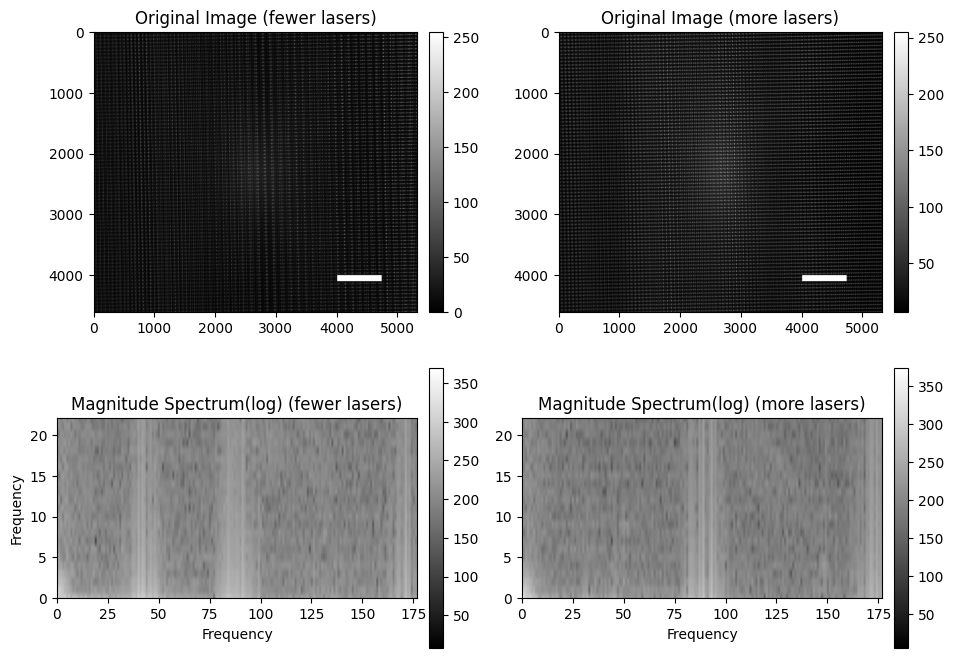

fewer laser contrast:0.93,more laser contrast:0.77


In [153]:
draw_fft_8um_test11(0.344)

draw_fft_8um_test1.1
z=0.30100000000000005


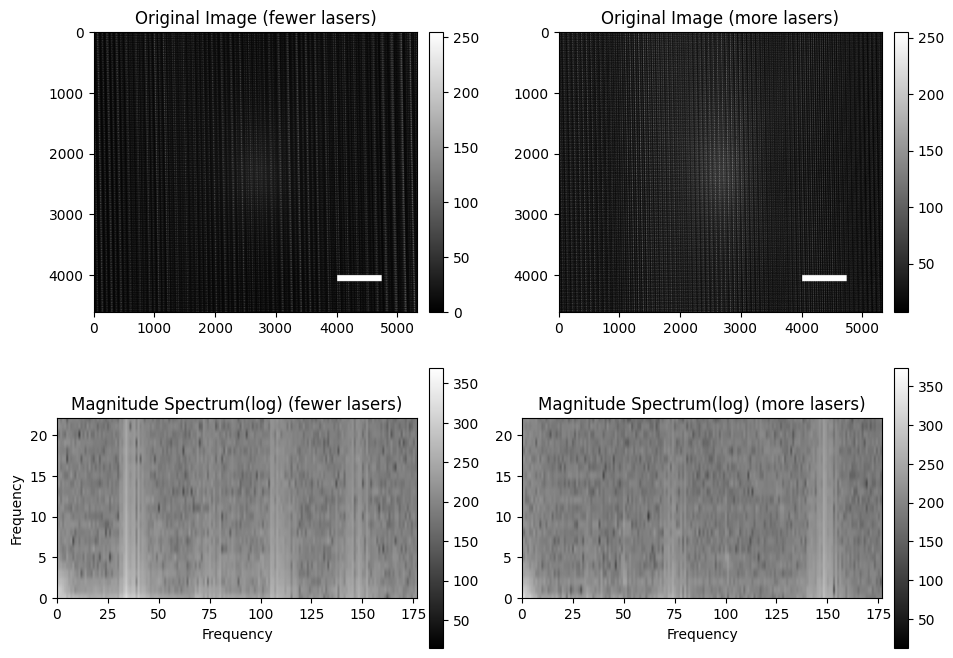

fewer laser contrast:1.03,more laser contrast:0.65


In [154]:
draw_fft_8um_test11(0.394)

draw_fft_8um_test1.1
z=0.351


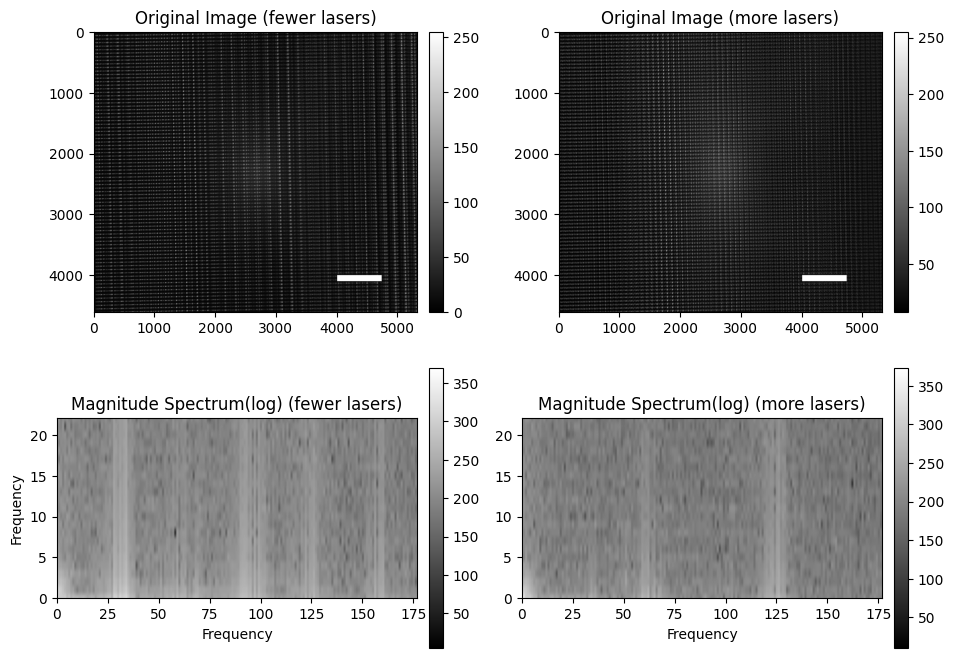

fewer laser contrast:0.99,more laser contrast:0.65


In [155]:
draw_fft_8um_test11(0.444)

## zoom in images

draw_fft_8um_test1.1
z=0.226


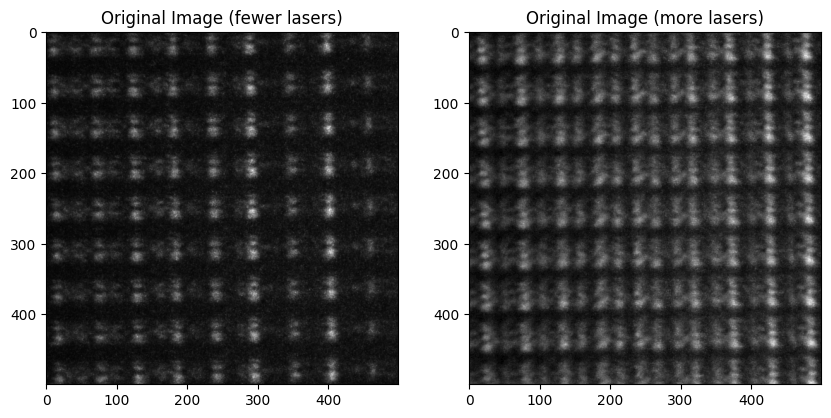

In [117]:
z=0.226+0.093
############################################# ^for fewer laser one PIC focus is at: z=0.093mm ; more lasers is at 0.093mm: 
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
# image = Image.open(file).convert('L')
########################################
print('draw_fft_8um_test1.1')
image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png";# Load the image of fewer laser
image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png"
########################################## ^
image = Image.open(image_name).convert('L')
image = np.array(image)
image = image[2000:2500, 2300:2800]  # Crop the image to the first 500x500 pixels
# Load the image of more laser
image2 = Image.open(image_name2).convert('L')
image2 = np.array(image2)
image2 = image2[2000:2500, 2300:2800]  # Crop the image to the first 500x500 pixels
# ... your code ...
# Display the original image and the magnitude spectrum
plt.figure(figsize=(10, 15))
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image (fewer lasers)')
plt.subplot(2, 2, 2)
plt.imshow(image2, cmap='gray')
plt.title('Original Image (more lasers)')
print('z='+str(z-0.093))
plt.show()

## def fft 8um test 1.1 bin

In [83]:
############################## 
def draw_fft_8um_test11_bin(z):
    from skimage import io
    import numpy as np
    from skimage.util import view_as_blocks
    import matplotlib.pyplot as plt
    from PIL import Image
    ############################################# ^for fewer laser one PIC focus is at: z=0.093mm ; more lasers is at 0.093mm: 
    ########################################
    print('draw_fft_8um_test1.1_bin')
    image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(round(z+0.093,3))+"_Exp23960.png";# Load the image of fewer laser
    image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(round(z+0.093,3))+"_Exp23960.png"
    ########################################## ^
    image1 = io.imread(image_name)
    image2 = io.imread(image_name2)
    block_size = (30, 30)

    # Convert the image to a numpy array
    array1 = np.array(image1)
    array1 = image1[:, :, 1]
    array1_cropped = array1[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array1 = np.mean(view_as_blocks(array1_cropped, block_size), axis=(-1, -2))

    array2 = np.array(image2)
    array2 = image2[:, :, 1]
    array2_cropped = array2[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array2 = np.mean(view_as_blocks(array2_cropped, block_size), axis=(-1, -2))

    ft = np.fft.ifftshift(binned_array1)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(binned_array2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=177;
    # Display the original image and the magnitude spectrum
    plt.figure(figsize=(10, 15))
    
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))
    axs[0, 0].imshow(binned_array1, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    axs[0, 1].imshow(binned_array2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    im1 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im1, ax=axs[1, 0], fraction=0.046, pad=0.04)
    im2 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im2, ax=axs[1, 1], fraction=0.046, pad=0.04)
    
    print('z='+str(z))
    plt.show()
    ####contrast
    import cv2
    from scipy import ndimage
    # Load the image
    img = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)
    contrast = img.std() / img.mean()
    contrast2 = img2.std() / img2.mean()
    print(f"fewer laser contrast:{round(contrast,2)},more laser contrast:{round(contrast2,2)}")


draw_fft_8um_test1.1_bin
z=0.2


<Figure size 1000x1500 with 0 Axes>

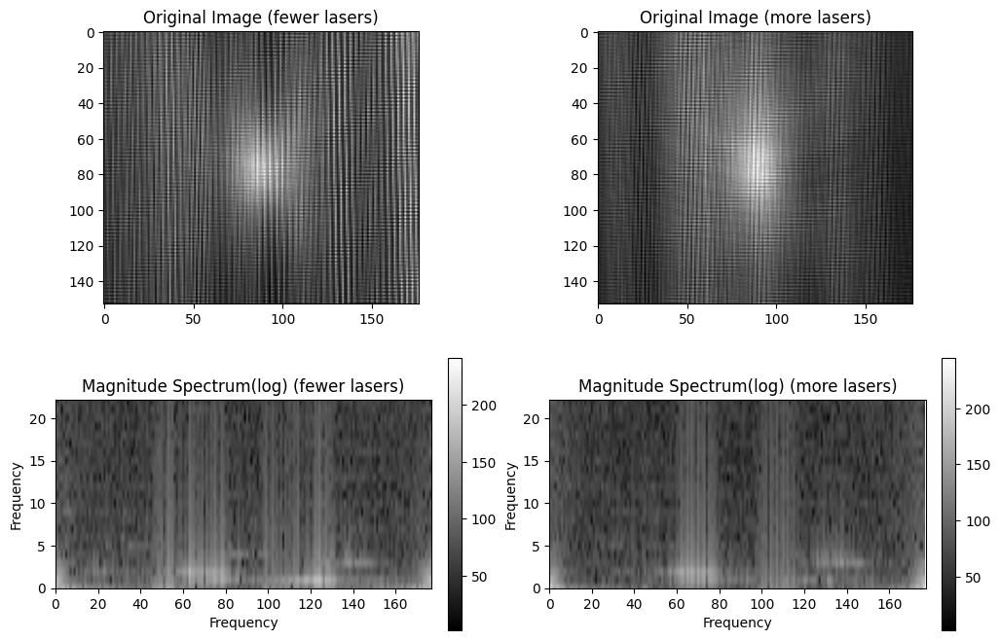

fewer laser contrast:0.71,more laser contrast:0.51


In [84]:
draw_fft_8um_test11_bin(0.200)

draw_fft_8um_test1.1_bin
z=0.251


<Figure size 1000x1500 with 0 Axes>

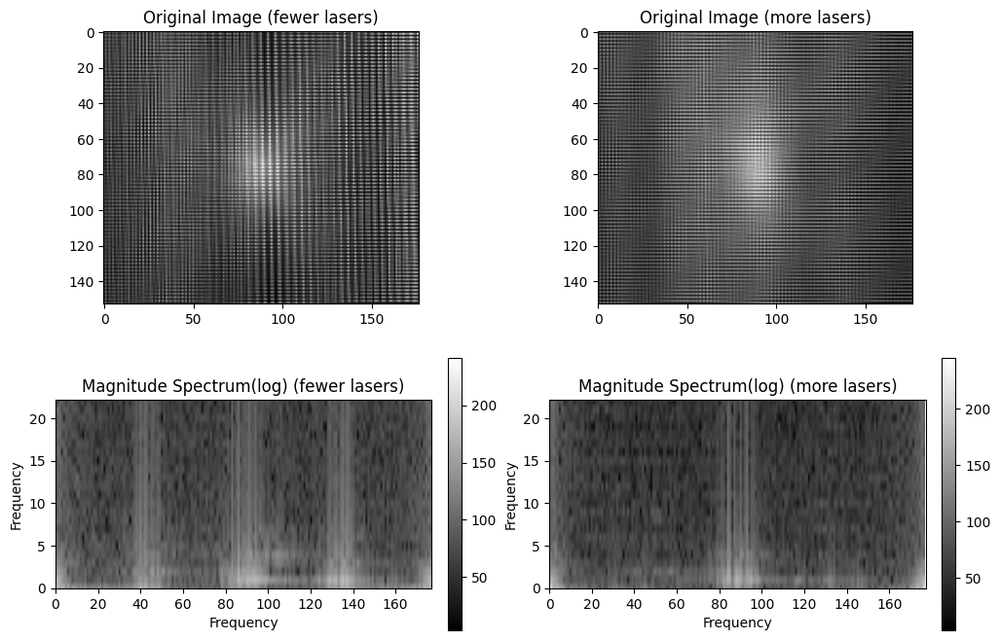

fewer laser contrast:0.93,more laser contrast:0.77


In [85]:
draw_fft_8um_test11_bin(0.251)

draw_fft_8um_test1.1_bin
z=0.301


<Figure size 1000x1500 with 0 Axes>

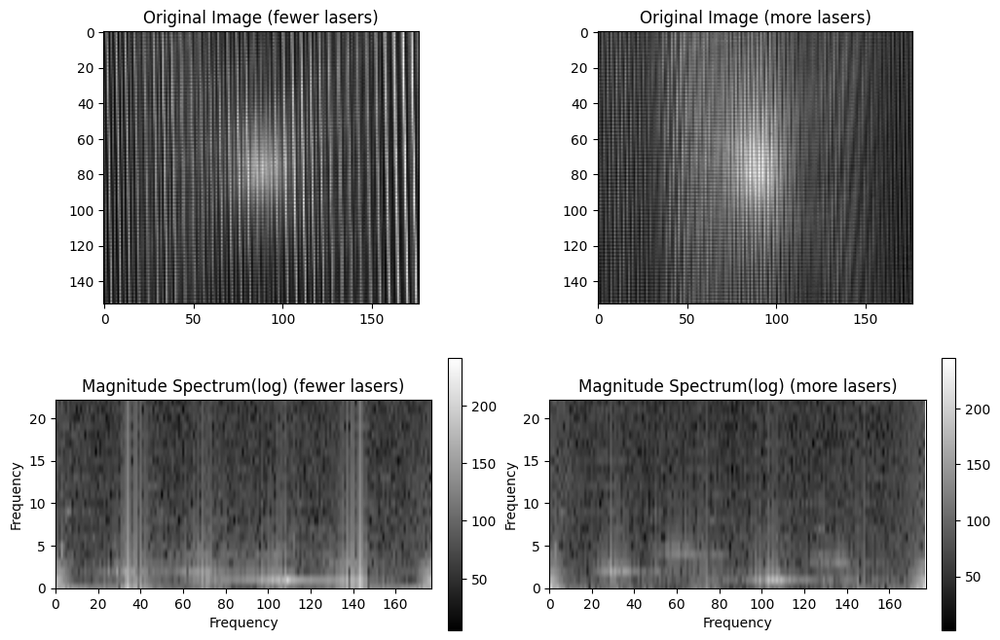

fewer laser contrast:1.03,more laser contrast:0.65


In [86]:
draw_fft_8um_test11_bin(0.301)

draw_fft_8um_test1.1_bin
z=0.351


<Figure size 1000x1500 with 0 Axes>

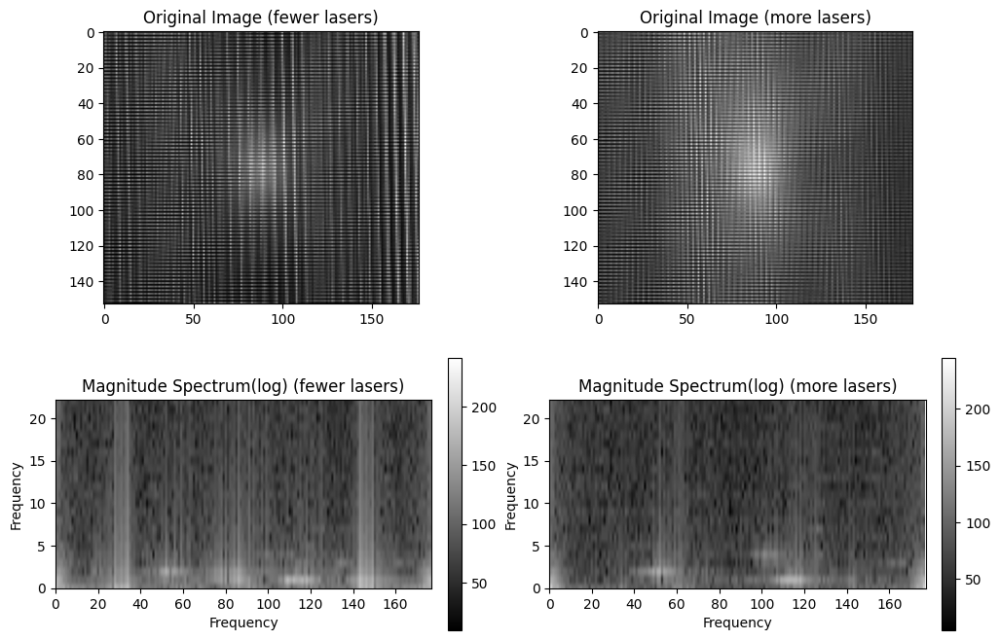

fewer laser contrast:0.99,more laser contrast:0.65


In [87]:
draw_fft_8um_test11_bin(0.351)

# def fft analysis image input

In [108]:
############################## 
def fft_array_input(array):
    ############################################# ^
    import numpy as np
    ft = np.fft.ifftshift(array)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))

    return magnitude_spectrum
    
    # f_range=100;
    # plt.subplot(1, 2, 1)
    # plt.imshow(magnitude_spectrum, cmap='gray',aspect=1)
    # plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
    # plt.xlim([-0, f_range])
    # plt.ylim([-0, f_range/2])
    # plt.ylabel('Frequency')
    # plt.title('Magnitude Spectrum(log) (fewer lasers)')
    
    # plt.subplot(1, 2, 2)
    # plt.imshow(magnitude_spectrum2, cmap='gray',aspect=1)
    # plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
    # plt.xlim([-0, f_range])
    # plt.ylim([-0, f_range/2])
    # plt.ylabel('Frequency')
    # plt.title('Magnitude Spectrum(log) (more lasers)')
    # print('')
    # print('z='+str(z2))
    # plt.show()

# def fft analysis 8um_test1

In [165]:
############################## 
def draw_fft_8um_test1(z1,z2):
    ############################################# ^
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    # image = Image.open(file).convert('L')
    ######################################## for fewer laser one PIC focus is at: z=0.08mm ; more lasers is at 0mm: 
    print('draw_fft_8um_test1')
    image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-L2R1ON_X0.000_Y0.000_Z"+z1+"_Exp20900.png"# Load the image of fewer laser
    image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-ALLON_X0.000_Y0.000_Z"+z2+"_Exp20900.png"
    ########################################## ^
    image = Image.open(image_name).convert('L') # Load the image of fewer laser
    image2 = Image.open(image_name2).convert('L')# Load the image of more laser
    
    ft = np.fft.ifftshift(image)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(image2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=177;
    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    image = np.array(image)
    image2 = np.array(image2)
    max_value = image.max()
    image = (image / max_value) * 255
    max_value2 = image2.max()
    image2 = (image2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(image, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(image2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    print('')
    print('z='+str(z2))
    plt.show()
    ####contrast
    import cv2
    from scipy import ndimage
    # Load the image
    img = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)
    contrast = img.std() / img.mean()
    contrast2 = img2.std() / img2.mean()
    print(f"fewer laser contrast:{round(contrast,2)},more laser contrast:{round(contrast2,2)}")


draw_fft_8um_test1

z=0.200


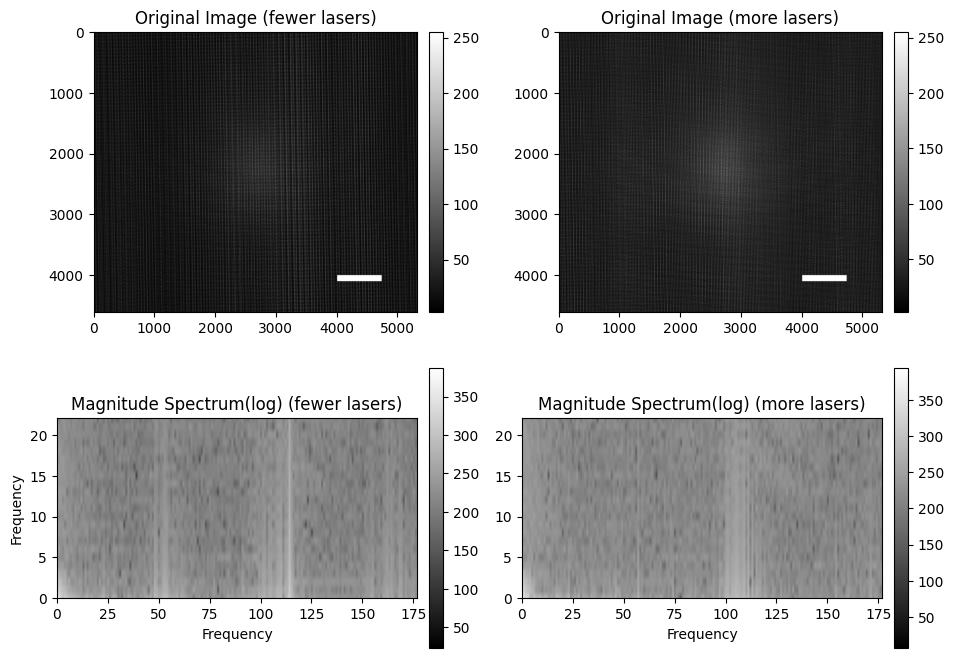

fewer laser contrast:0.57,more laser contrast:0.51


In [166]:
draw_fft_8um_test1("0.280","0.200")

draw_fft_8um_test1

z=0.250


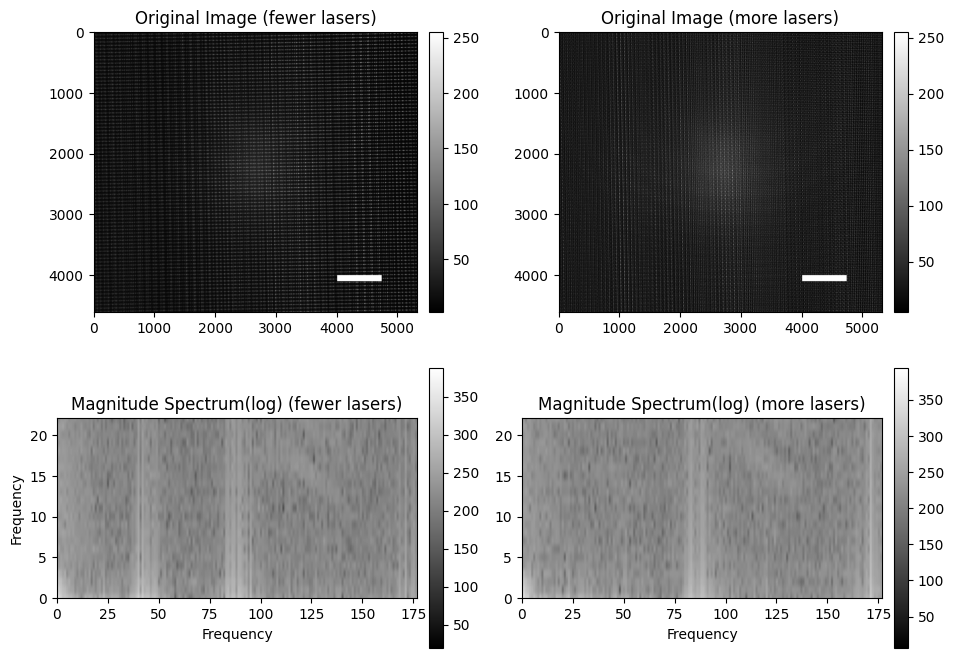

fewer laser contrast:0.82,more laser contrast:0.47


In [167]:
draw_fft_8um_test1("0.330","0.250")

draw_fft_8um_test1

z=0.300


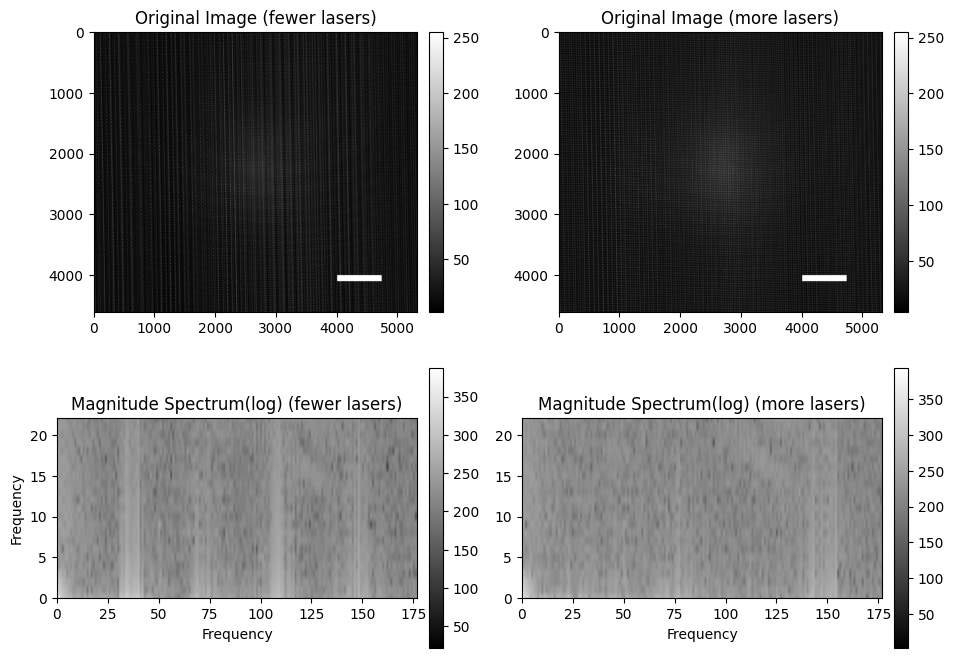

fewer laser contrast:0.66,more laser contrast:0.56


In [168]:
draw_fft_8um_test1("0.380","0.300")

draw_fft_8um_test1

z=0.350


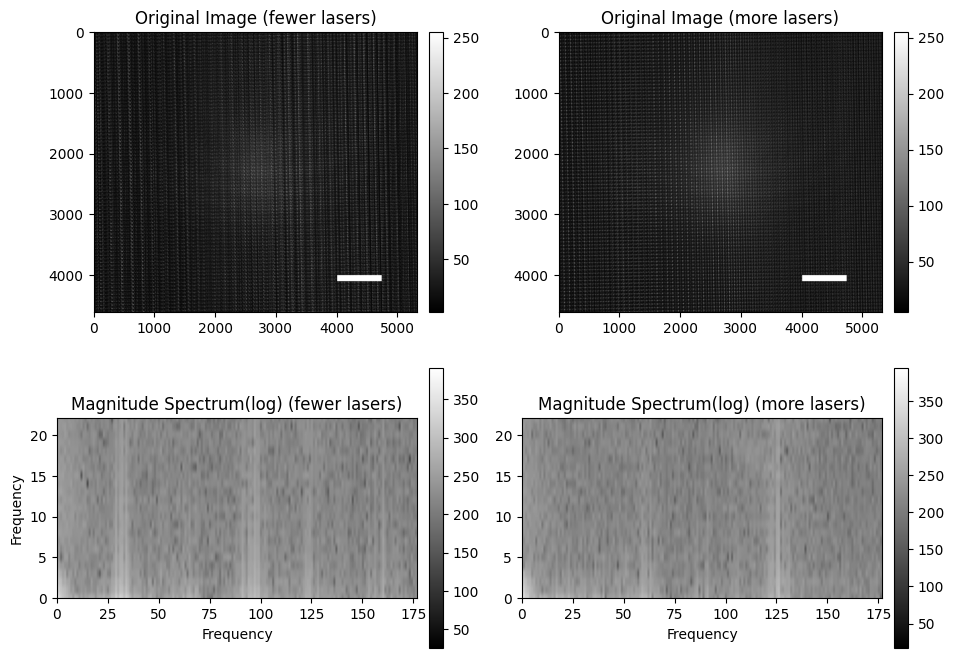

fewer laser contrast:0.61,more laser contrast:0.48


In [169]:
draw_fft_8um_test1("0.430","0.350")

## def fft 8um test1 bin

In [101]:
from decimal import Decimal, ROUND_DOWN
number = Decimal(0.400).quantize(Decimal('.001'), rounding=ROUND_DOWN)
print(str(number))

0.400


In [181]:
############################## 
def draw_fft_8um_test1_bin(z1,z2):
    from skimage import io
    import numpy as np
    from skimage.util import view_as_blocks
    import matplotlib.pyplot as plt
    from PIL import Image
    from decimal import Decimal, ROUND_DOWN
    ######################################## for fewer laser one PIC focus is at: z=0.08mm ; more lasers is at 0mm: 
    print('draw_fft_8um_test1_bin')
    image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-L2R1ON_X0.000_Y0.000_Z"+z1+"_Exp20900.png"# Load the image of fewer laser
    image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-ALLON_X0.000_Y0.000_Z"+z2+"_Exp20900.png"
    ########################################## ^
    image1 = io.imread(image_name)
    image2 = io.imread(image_name2)
    block_size = (30, 30)

    # Convert the image to a numpy array
    array1 = np.array(image1)
    array1 = image1[:, :, 1]
    array1_cropped = array1[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array1 = np.mean(view_as_blocks(array1_cropped, block_size), axis=(-1, -2))

    array2 = np.array(image2)
    array2 = image2[:, :, 1]
    array2_cropped = array2[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array2 = np.mean(view_as_blocks(array2_cropped, block_size), axis=(-1, -2))

    ft = np.fft.ifftshift(binned_array1)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(binned_array2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=177;

    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    max_value = binned_array1.max()
    binned_array1 = (binned_array1 / max_value) * 255
    max_value2 = binned_array2.max()
    binned_array2 = (binned_array2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(binned_array1, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(binned_array2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    print('z='+str(z2))
    plt.show()

draw_fft_8um_test1_bin
z=0.200


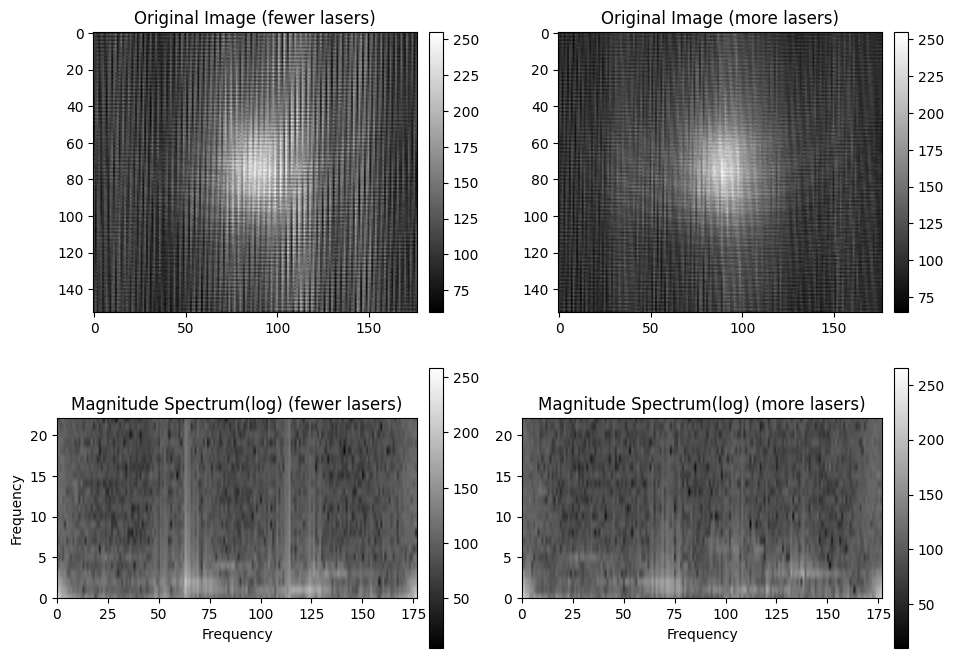

In [182]:
draw_fft_8um_test1_bin("0.280","0.200")

draw_fft_8um_test1_bin
z=0.250


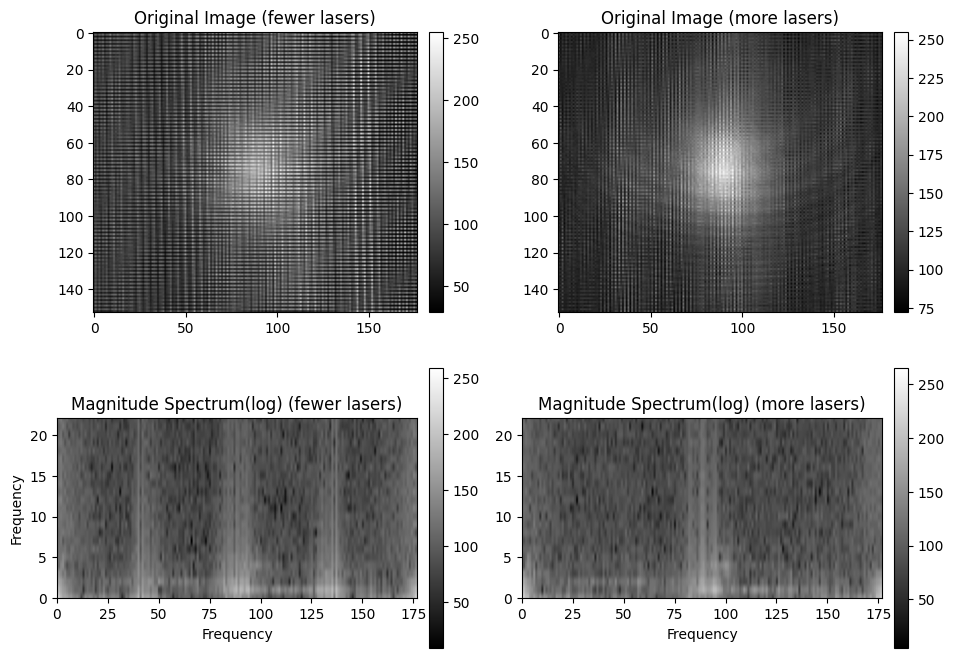

In [183]:
draw_fft_8um_test1_bin("0.330","0.250")

draw_fft_8um_test1_bin
z=0.300


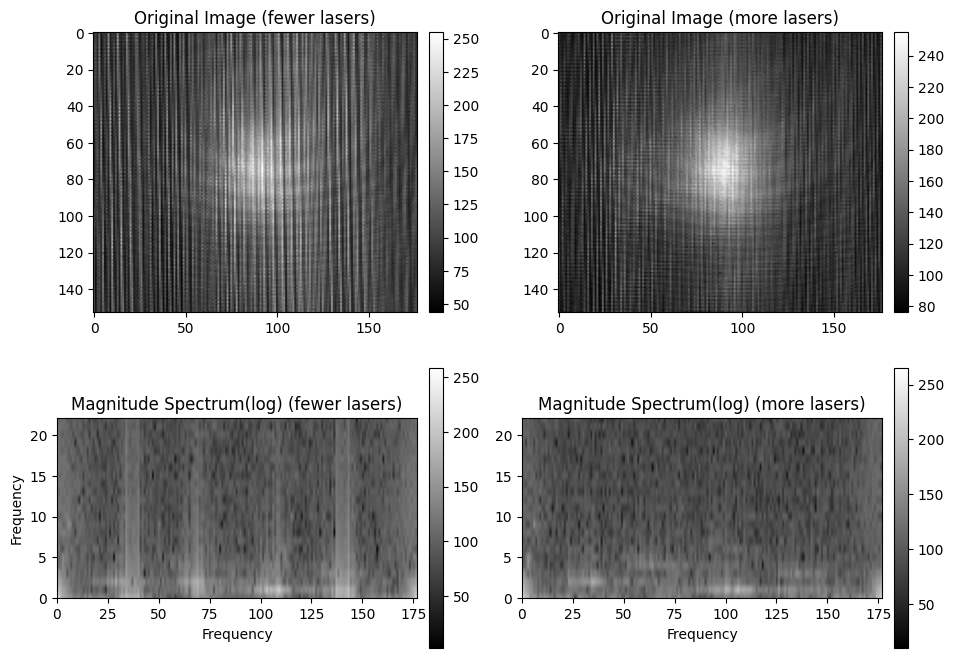

In [184]:
draw_fft_8um_test1_bin("0.380","0.300")

draw_fft_8um_test1_bin
z=0.350


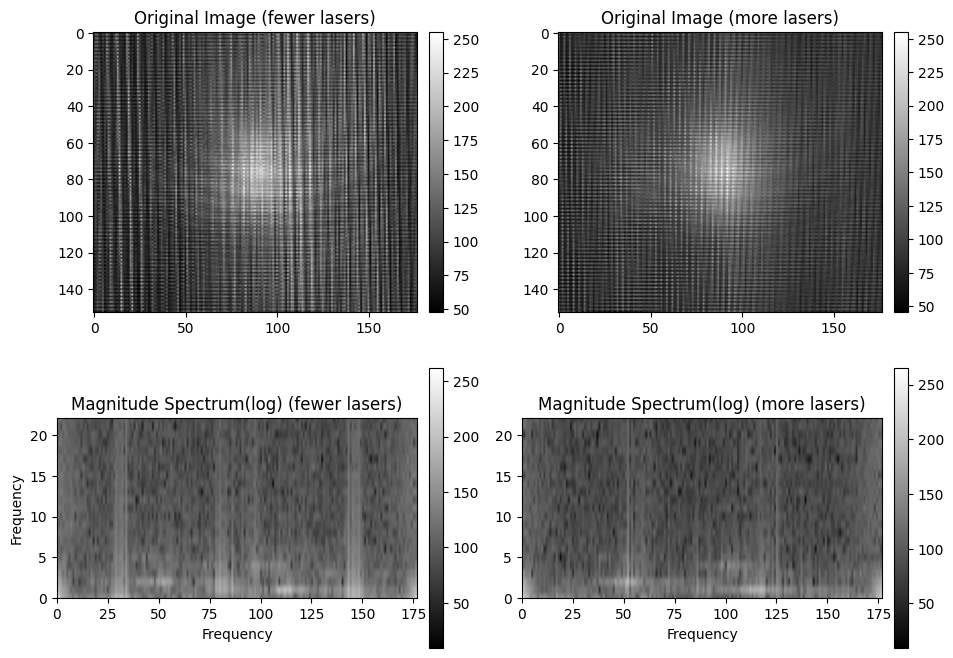

In [185]:
draw_fft_8um_test1_bin("0.430","0.350")

# def fft analysis 20um_test1.1

In [160]:
############################## 
def draw_fft_20um_test11(z):
    ############################################# ^
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    # image = Image.open(file).convert('L')
    ######################################## for fewer laser one PIC focus is at: z=2.944mm ; more lasers is at 2.961mm: 
    print('draw_fft_20um_test11')
    foldername="/Users/qingjunwang/Documents/code/python/data_multisource/20um test 1.1 selection"
    image_name=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_DualInjection-R1ON-ZF2.956_X0.000_Y0.000_Z"+str(round(z+2.944,3))+"_Exp20648.png"
    image_name2=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_SingleInjection-R1R2ON-ZF2.944_X0.000_Y0.000_Z"+str(round(z+2.961,3))+"_Exp20648.png"
    ############################################ ^
    image = Image.open(image_name).convert('L') # Load the image of fewer laser
    image2 = Image.open(image_name2).convert('L')# Load the image of more laser
    
    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    ft = np.fft.ifftshift(image)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(image2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=177;
    
    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    image = np.array(image)
    image2 = np.array(image2)
    max_value = image.max()
    image = (image / max_value) * 255
    max_value2 = image2.max()
    image2 = (image2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(image, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(image2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    
    print('')
    print('z='+str(z))
    plt.show()
    
    ####contrast
    import cv2
    from scipy import ndimage
    # Load the image
    img = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)
    contrast = img.std() / img.mean()
    contrast2 = img2.std() / img2.mean()
    print(f"fewer laser contrast:{round(contrast,2)},more laser contrast:{round(contrast2,2)}")

    

draw_fft_20um_test11

z=0.2


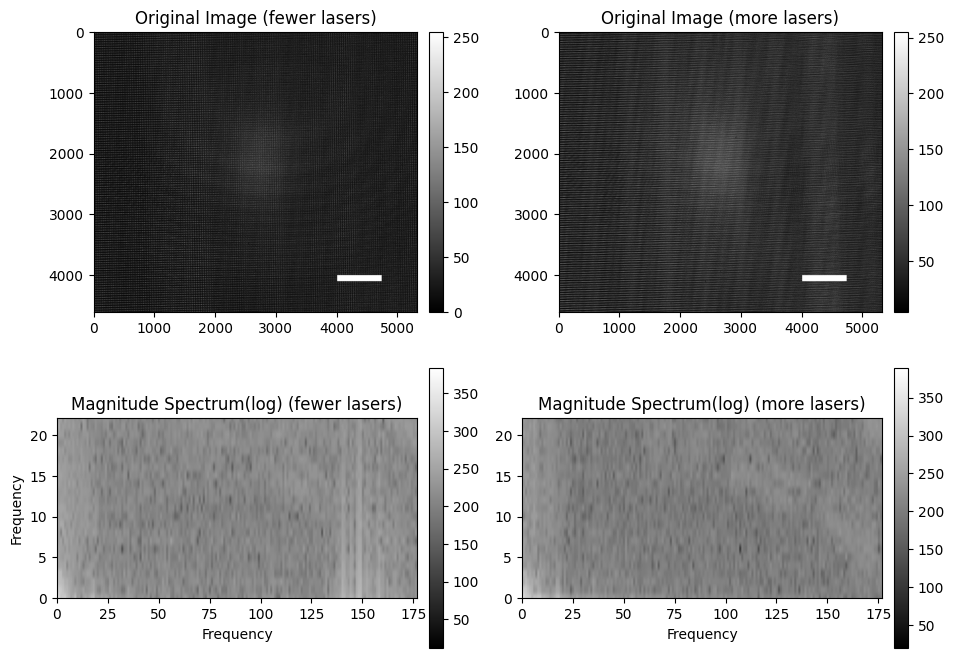

fewer laser contrast:0.6,more laser contrast:0.48


In [164]:
draw_fft_20um_test11(0.20)

draw_fft_20um_test11

z=0.25


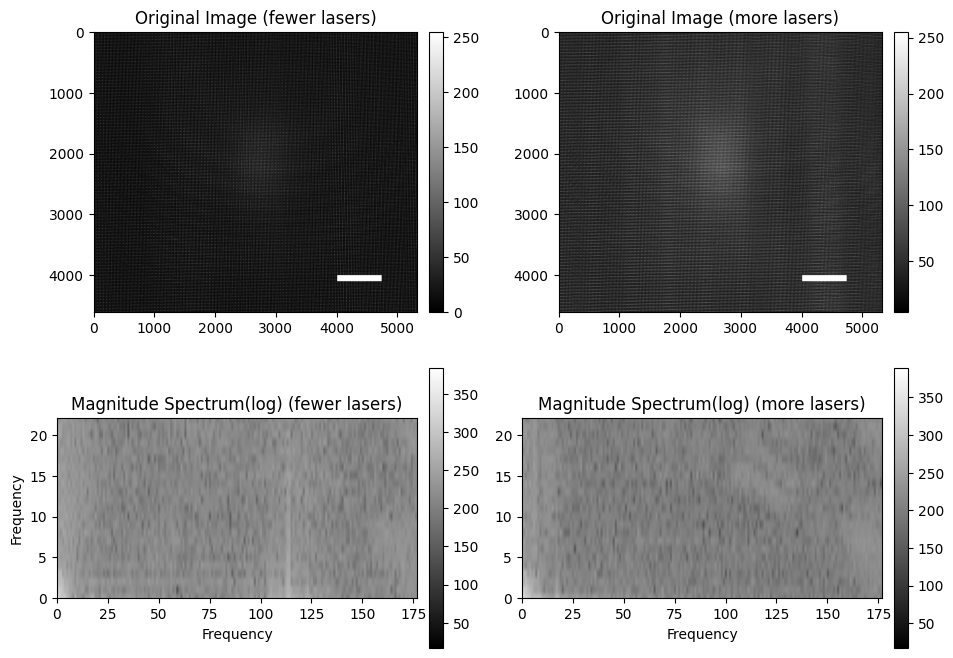

fewer laser contrast:0.79,more laser contrast:0.41


In [161]:
draw_fft_20um_test11(0.25)

draw_fft_20um_test11

z=0.3


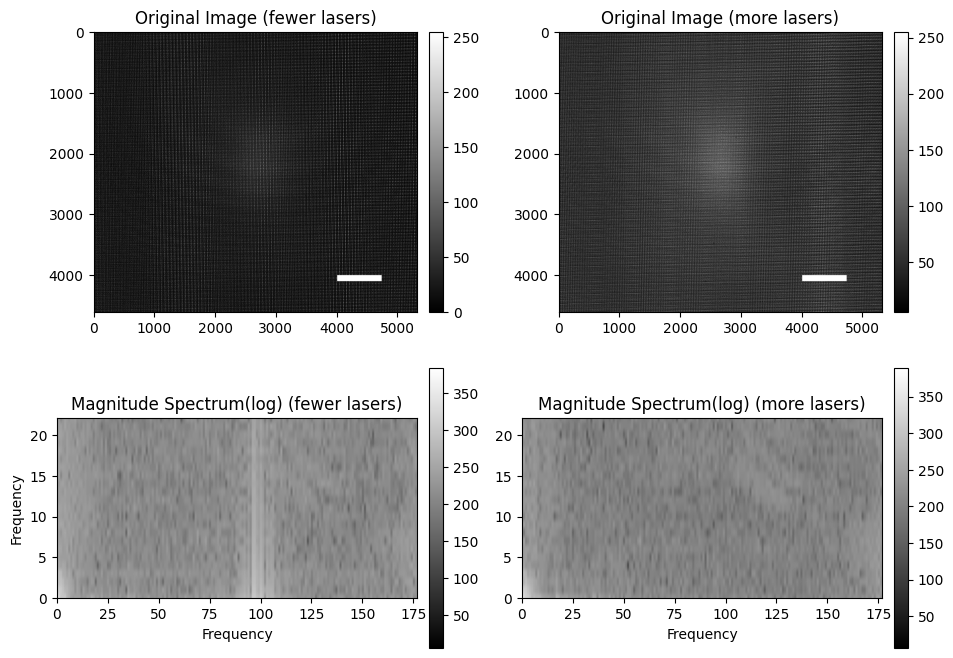

fewer laser contrast:0.7,more laser contrast:0.38


In [162]:
draw_fft_20um_test11(0.30)

draw_fft_20um_test11

z=0.35


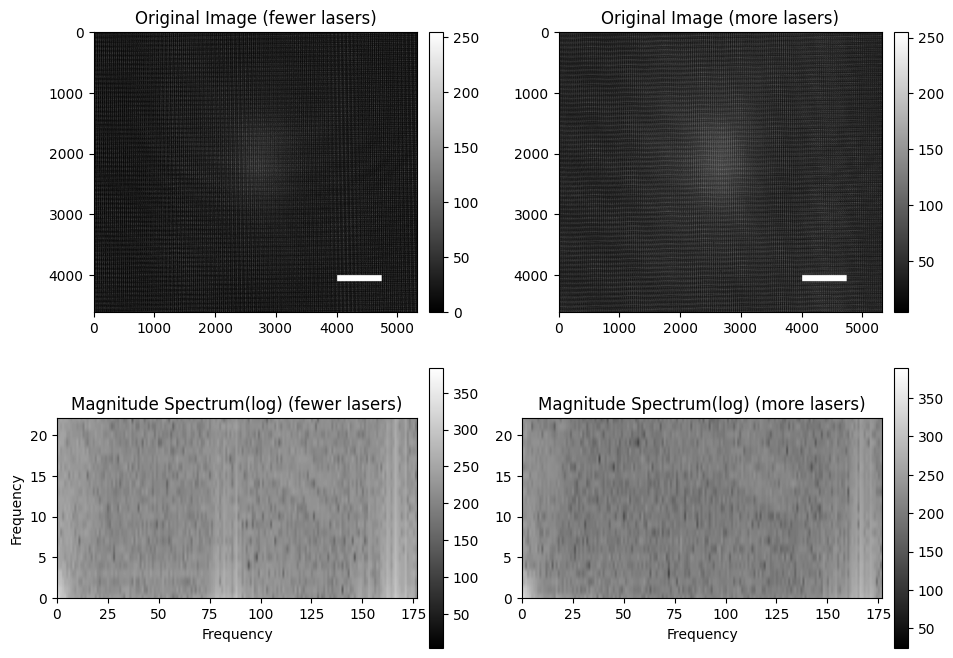

fewer laser contrast:0.73,more laser contrast:0.48


In [163]:
draw_fft_20um_test11(0.35)

## def fft analysis 20um_test1.1 bin

In [186]:
############################## 
def draw_fft_20um_test11_bin(z):
    from skimage import io
    import numpy as np
    from skimage.util import view_as_blocks
    import matplotlib.pyplot as plt
    from PIL import Image
    ############################################# ^for fewer laser one PIC focus is at: z=0.093mm ; more lasers is at 0.093mm: 
    ######################################## for fewer laser one PIC focus is at: z=2.944mm ; more lasers is at 2.961mm: 
    print('draw_fft_20um_test11')
    foldername="/Users/qingjunwang/Documents/code/python/data_multisource/20um test 1.1 selection"
    image_name=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_DualInjection-R1ON-ZF2.956_X0.000_Y0.000_Z"+str(round(z+2.944,3))+"_Exp20648.png"
    image_name2=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_SingleInjection-R1R2ON-ZF2.944_X0.000_Y0.000_Z"+str(round(z+2.961,3))+"_Exp20648.png"
    ############################################ ^
    image1 = io.imread(image_name)
    image2 = io.imread(image_name2)
    block_size = (30, 30)

    # Convert the image to a numpy array
    array1 = np.array(image1)
    array1 = image1[:, :, 1]
    array1_cropped = array1[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array1 = np.mean(view_as_blocks(array1_cropped, block_size), axis=(-1, -2))

    array2 = np.array(image2)
    array2 = image2[:, :, 1]
    array2_cropped = array2[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array2 = np.mean(view_as_blocks(array2_cropped, block_size), axis=(-1, -2))

    ft = np.fft.ifftshift(binned_array1)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(binned_array2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=177;
    # Display the original image and the magnitude spectrum
    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    max_value = binned_array1.max()
    binned_array1 = (binned_array1 / max_value) * 255
    max_value2 = binned_array2.max()
    binned_array2 = (binned_array2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(binned_array1, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(binned_array2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    print('z='+str(z))
    plt.show()

draw_fft_20um_test11
z=0.2


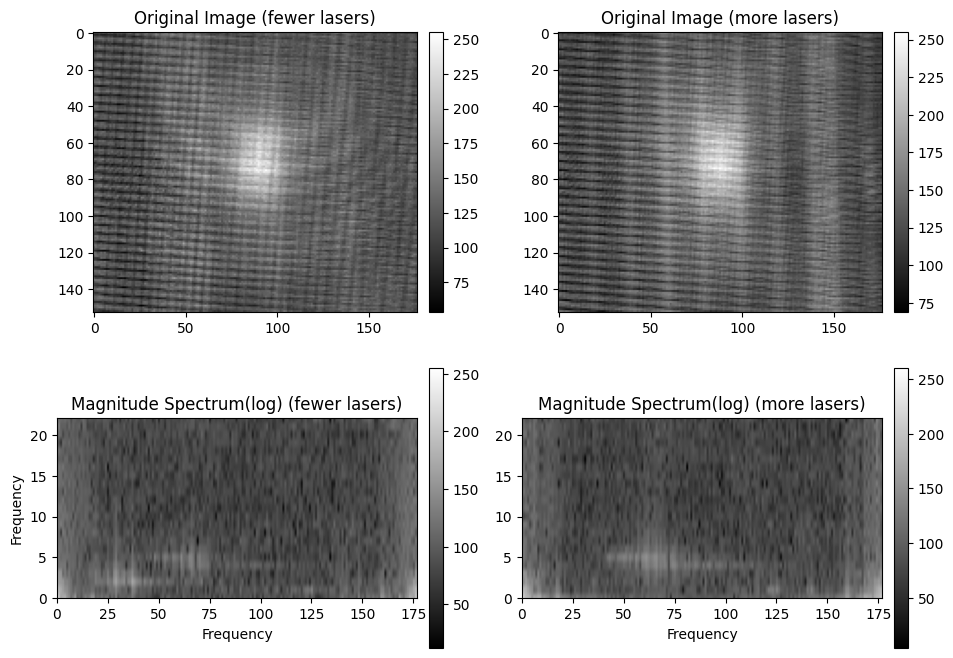

In [187]:
draw_fft_20um_test11_bin(0.20)

draw_fft_20um_test11
z=0.25


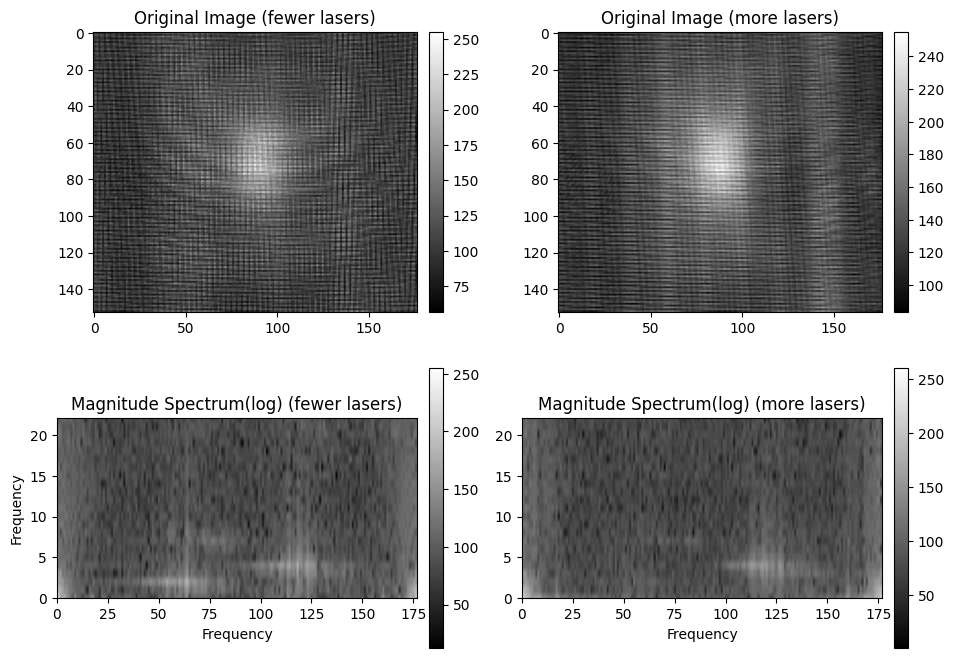

In [188]:
draw_fft_20um_test11_bin(0.25)

draw_fft_20um_test11
z=0.3


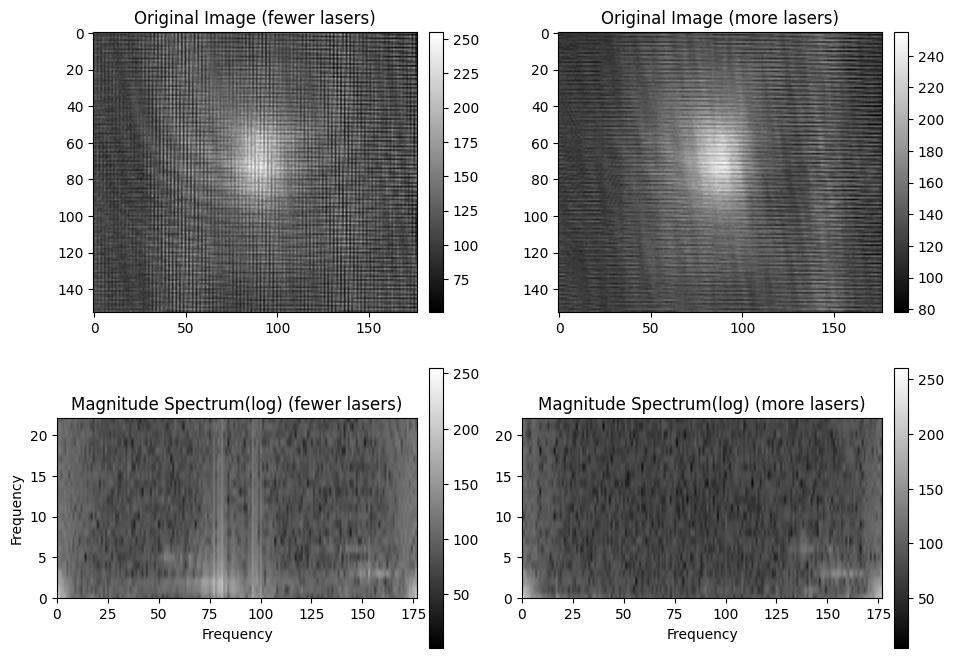

In [189]:
draw_fft_20um_test11_bin(0.3)

draw_fft_20um_test11
z=0.35


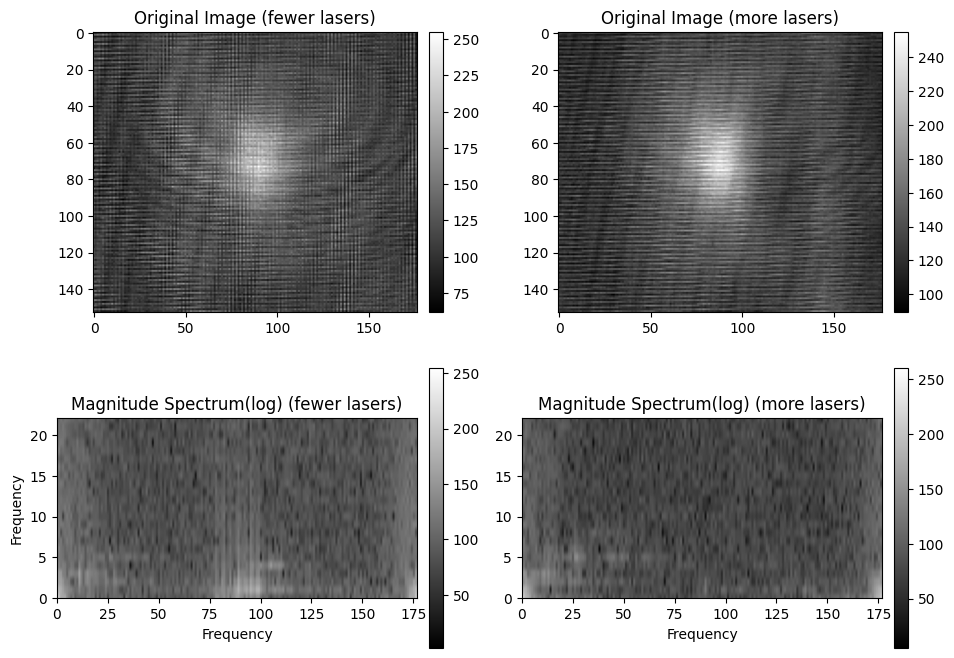

In [190]:
draw_fft_20um_test11_bin(0.35)

# def fft analysis 20um_test1

In [170]:
############################## 
def draw_fft_20um_test1(z):
    ############################################# ^
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    # image = Image.open(file).convert('L')
   ######################################## for fewer laser one PIC focus is at: z=2.95mm ; more lasers is at 2.95mm: 
    print('draw_fft_20um_test11')
    foldername="/Users/qingjunwang/Documents/code/python/data_multisource/20um test 1 selection"
    image_name=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_DualInjection-L2R1ON-ZF2.961_X0.000_Y0.000_Z"+str(Decimal(z+2.95).quantize(Decimal('.001'), rounding=ROUND_DOWN))+"_Exp25149.png"
    image_name2=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_SingleInjection-ALLON-ZF2.950_X0.000_Y0.000_Z"+str(Decimal(z+2.95).quantize(Decimal('.001'), rounding=ROUND_DOWN))+"_Exp25149.png"
    ############################################ ^
    image = Image.open(image_name).convert('L') # Load the image of fewer laser
    image2 = Image.open(image_name2).convert('L')# Load the image of more laser
    
    ft = np.fft.ifftshift(image)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(image2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=175;
    
    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    image = np.array(image)
    image2 = np.array(image2)
    max_value = image.max()
    image = (image / max_value) * 255
    max_value2 = image2.max()
    image2 = (image2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(image, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(image2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    print('z='+str(z))
    plt.show()
    ####contrast
    import cv2
    from scipy import ndimage
    # Load the image
    img = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)
    contrast = img.std() / img.mean()
    contrast2 = img2.std() / img2.mean()
    print(f"fewer laser contrast:{round(contrast,2)},more laser contrast:{round(contrast2,2)}")


draw_fft_20um_test11

z=0.2


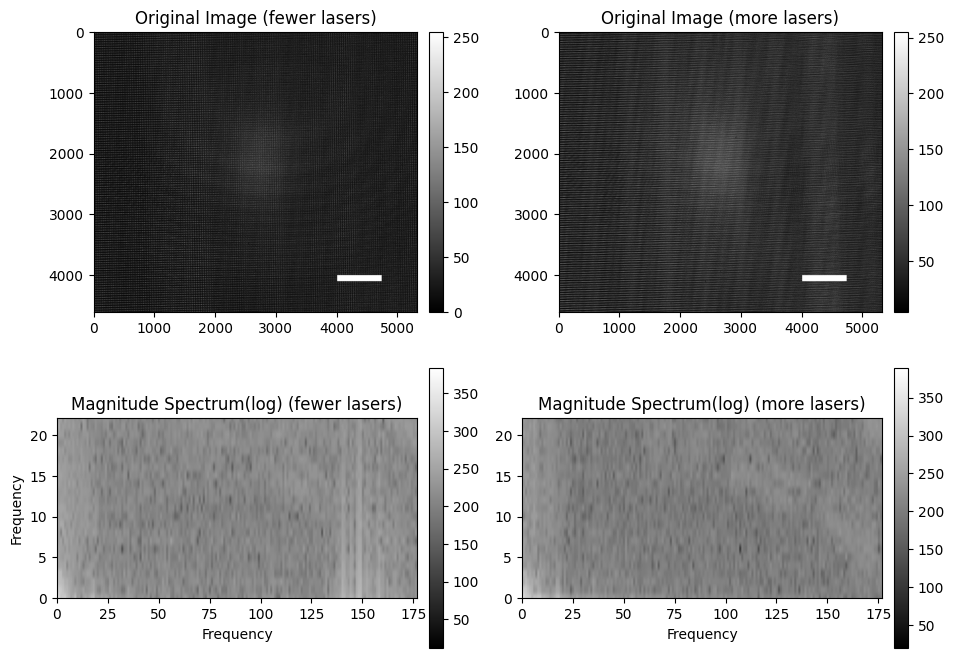

fewer laser contrast:0.6,more laser contrast:0.48


In [171]:
draw_fft_20um_test11(0.20)

draw_fft_20um_test11

z=0.25


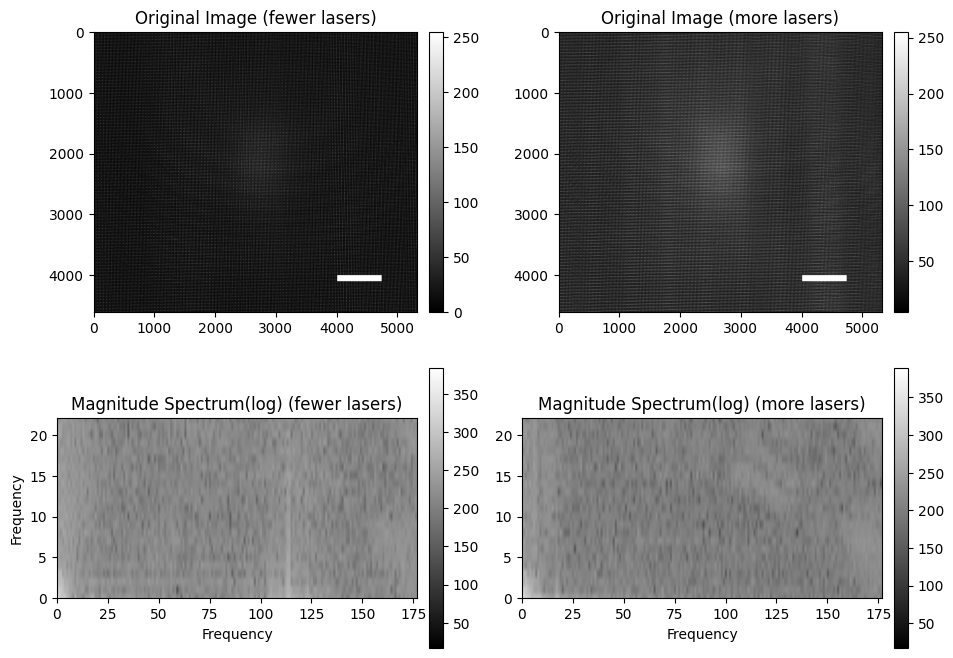

fewer laser contrast:0.79,more laser contrast:0.41


In [172]:
draw_fft_20um_test11(0.25)

draw_fft_20um_test11

z=0.3


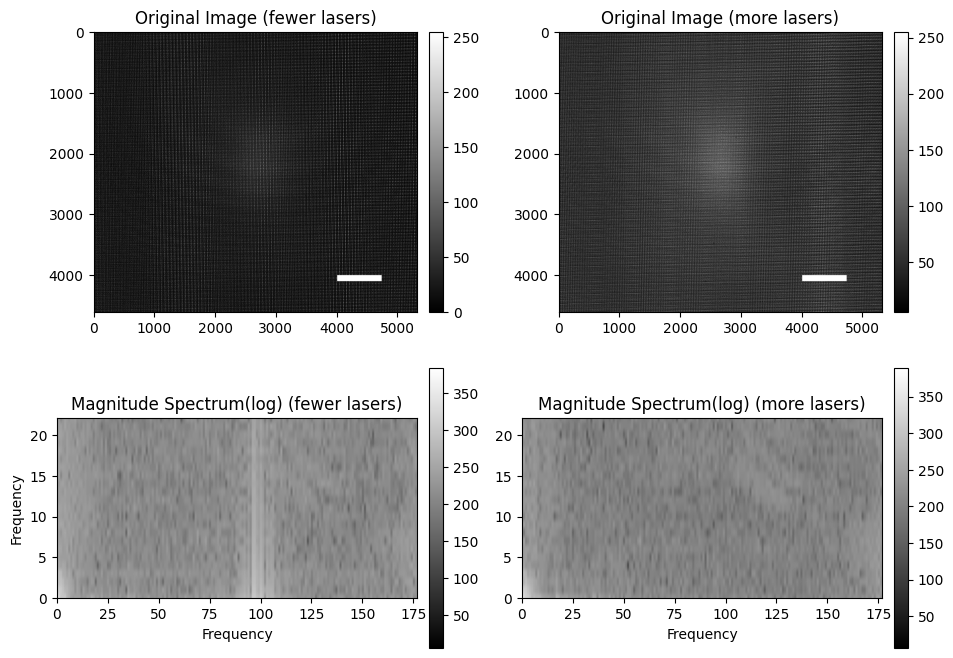

fewer laser contrast:0.7,more laser contrast:0.38


In [173]:
draw_fft_20um_test11(0.30)

draw_fft_20um_test11

z=0.35


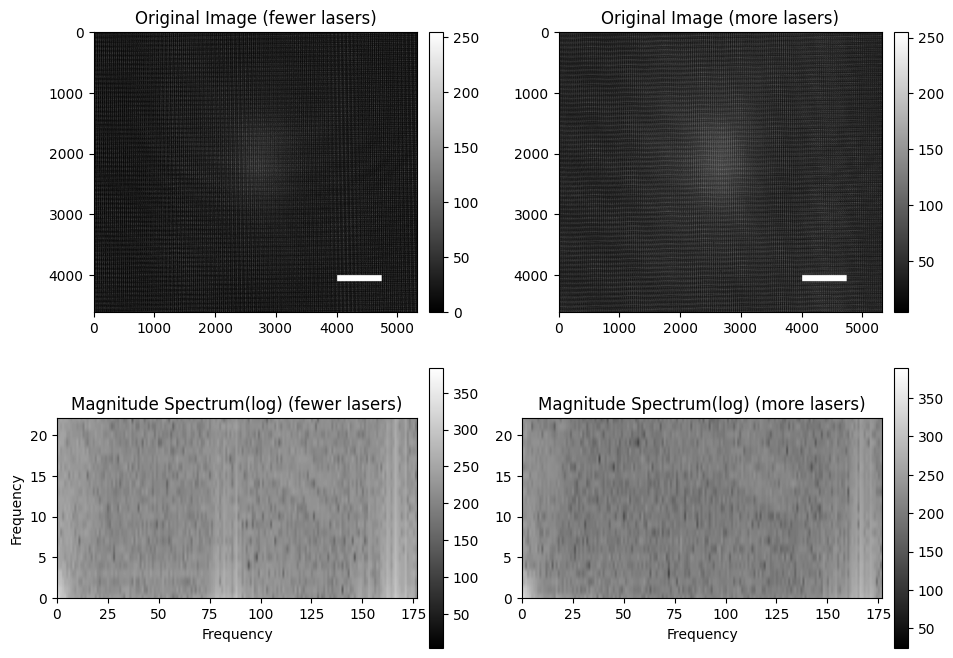

fewer laser contrast:0.73,more laser contrast:0.48


In [174]:
draw_fft_20um_test11(0.35)

## def_fft_20um_test1_bin

In [191]:
############################## 
def draw_fft_20um_test1_bin(z):
    from decimal import Decimal, ROUND_DOWN
    from skimage import io
    import numpy as np
    from skimage.util import view_as_blocks
    import matplotlib.pyplot as plt
    from PIL import Image
    ############################################# ^for fewer laser one PIC focus is at: z=0.093mm ; more lasers is at 0.093mm: 
   ######################################## for fewer laser one PIC focus is at: z=2.95mm ; more lasers is at 2.95mm: 
    print('draw_fft_20um_test11_bin')
    foldername="/Users/qingjunwang/Documents/code/python/data_multisource/20um test 1 selection"
    image_name=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_DualInjection-L2R1ON-ZF2.961_X0.000_Y0.000_Z"+str(Decimal(z+2.95).quantize(Decimal('.001'), rounding=ROUND_DOWN))+"_Exp25149.png"
    image_name2=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_SingleInjection-ALLON-ZF2.950_X0.000_Y0.000_Z"+str(Decimal(z+2.95).quantize(Decimal('.001'), rounding=ROUND_DOWN))+"_Exp25149.png"
    ############################################ ^
    image1 = io.imread(image_name)
    image2 = io.imread(image_name2)
    block_size = (30, 30)

    # Convert the image to a numpy array
    array1 = np.array(image1)
    array1 = image1[:, :, 1]
    array1_cropped = array1[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array1 = np.mean(view_as_blocks(array1_cropped, block_size), axis=(-1, -2))

    array2 = np.array(image2)
    array2 = image2[:, :, 1]
    array2_cropped = array2[:4590,:5310]  # This will give you a 5310x4590 image
    binned_array2 = np.mean(view_as_blocks(array2_cropped, block_size), axis=(-1, -2))

    ft = np.fft.ifftshift(binned_array1)
    ft = np.fft.fft2(ft) #ft = np.fft.fftshift(ft)
    magnitude_spectrum = 20*np.log1p(np.abs(ft)) # magnitude_spectrum_lin = 20*(np.abs(ft))
    
    ft2 = np.fft.ifftshift(binned_array2)
    ft2 = np.fft.fft2(ft2)
    magnitude_spectrum2 = 20*np.log1p(np.abs(ft2))
    
    # set the display range
    f_range=175;
    # Display the original image and the magnitude spectrum

    fig, axs = plt.subplots(2, 2, figsize=(11, 8))
    max_value = binned_array1.max()
    binned_array1 = (binned_array1 / max_value) * 255
    max_value2 = binned_array2.max()
    binned_array2 = (binned_array2 / max_value2) * 255

    #scale bar 100um
    image[4000:4100, 4000:4730] = 255
    image2[4000:4100, 4000:4730] = 255

    im1 =axs[0, 0].imshow(binned_array1, cmap='gray')
    axs[0, 0].set_title('Original Image (fewer lasers)')
    fig.colorbar(im1, ax=axs[0, 0], fraction=0.04, pad=0.03)

    im2 =axs[0, 1].imshow(binned_array2, cmap='gray')
    axs[0, 1].set_title('Original Image (more lasers)')
    fig.colorbar(im2, ax=axs[0, 1], fraction=0.04, pad=0.03)

    im3 = axs[1, 0].imshow(magnitude_spectrum, cmap='gray',aspect=4)
    axs[1, 0].set_xlabel('Frequency') 
    axs[1, 0].set_xlim([0, f_range])
    axs[1, 0].set_ylim([0, f_range/8])
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title('Magnitude Spectrum(log) (fewer lasers)')
    fig.colorbar(im3, ax=axs[1, 0], fraction=0.04, pad=0.03)

    im4 = axs[1, 1].imshow(magnitude_spectrum2, cmap='gray',aspect=4)
    axs[1, 1].set_xlabel('Frequency') 
    axs[1, 1].set_xlim([0, f_range])
    axs[1, 1].set_ylim([0, f_range/8])
    axs[1, 1].set_title('Magnitude Spectrum(log) (more lasers)')
    fig.colorbar(im4, ax=axs[1, 1], fraction=0.04, pad=0.03)
    
    print('z='+str(z))
    plt.show()

draw_fft_20um_test11_bin
z=0.2


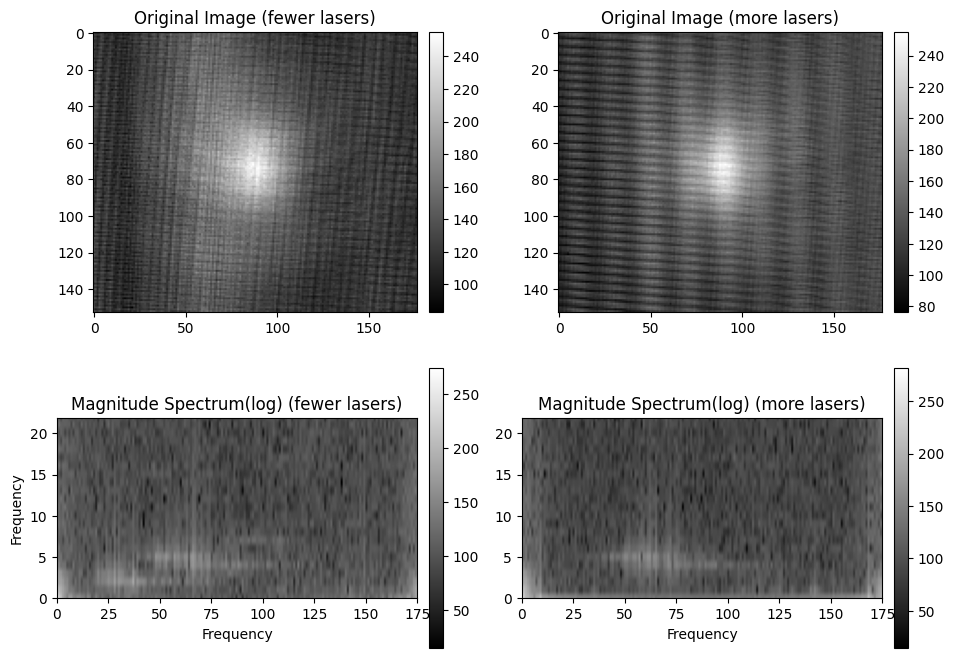

In [192]:
draw_fft_20um_test1_bin(0.2)

draw_fft_20um_test11_bin
z=0.25


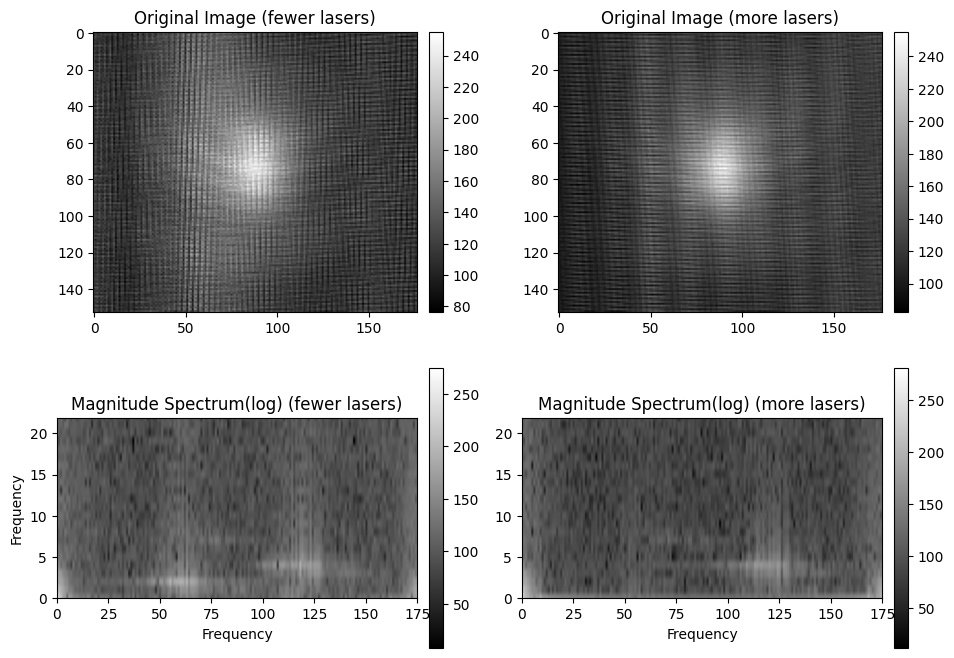

In [193]:
draw_fft_20um_test1_bin(0.250)

draw_fft_20um_test11_bin
z=0.3


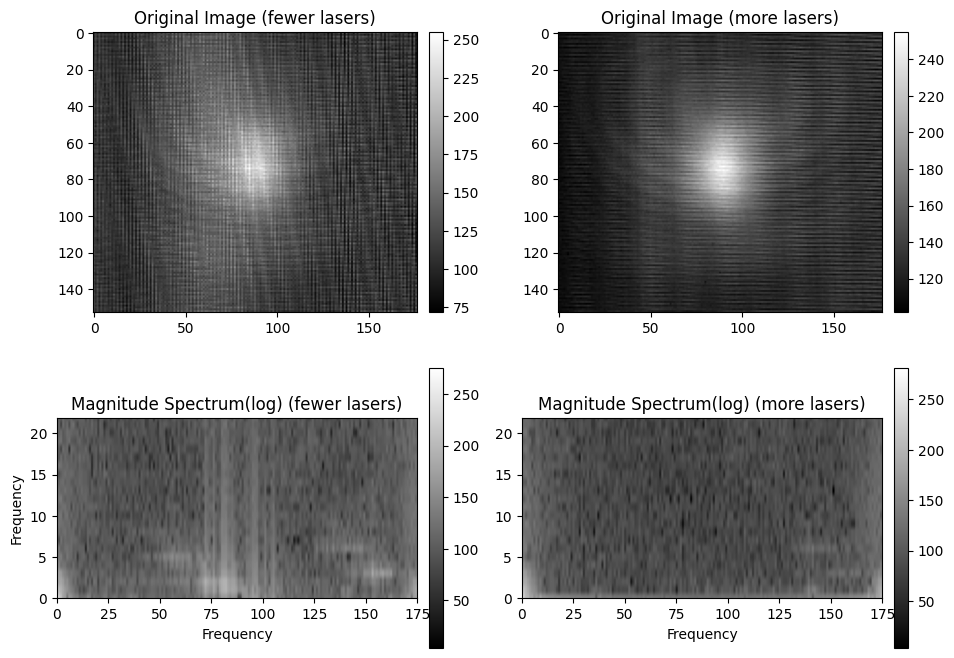

In [194]:
draw_fft_20um_test1_bin(0.300)

draw_fft_20um_test11_bin
z=0.35


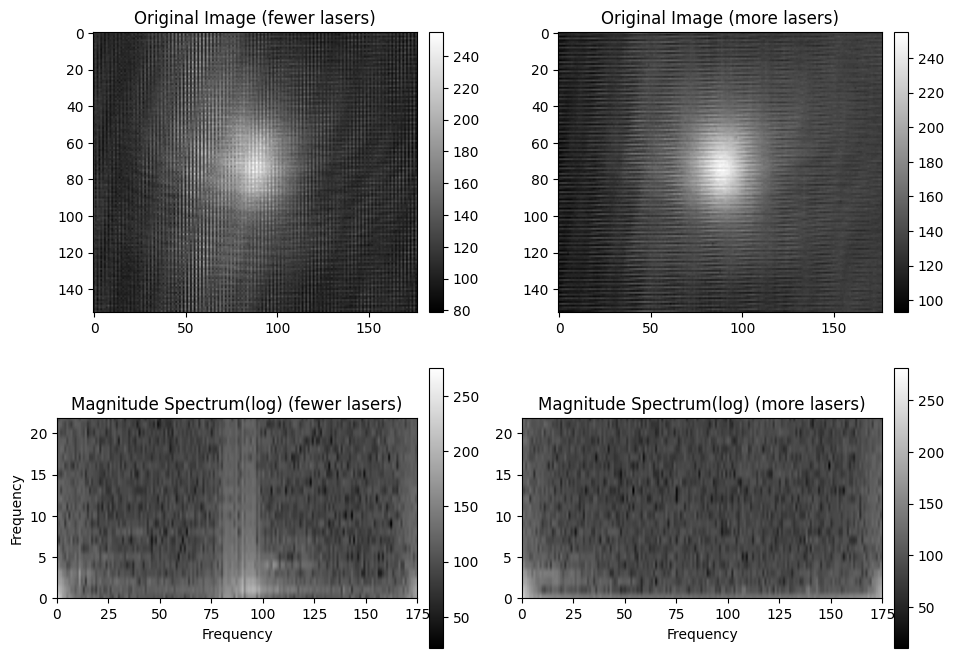

In [195]:
draw_fft_20um_test1_bin(0.350)

# Wavelet analysis

/var/folders/qb/z1ml4q756n396n6rdtzst_th0000gn/T/ipykernel_1144/788739353.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  original = imageio.imread(image_name)


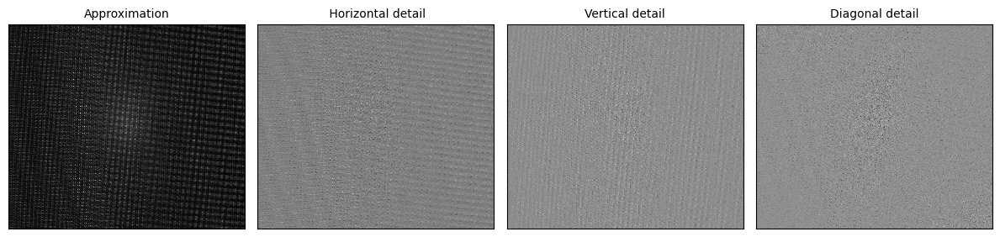

In [277]:
foldername="/Users/qingjunwang/Documents/code/python/data_multisource/20um test 1 selection"
image_name=foldername+"/Dinasi-FL2_D0C0_YSSI-P20-SD_Green_DualInjection-L2R1ON-ZF2.961_X0.000_Y0.000_Z"+str(Decimal(0.25+2.95).quantize(Decimal('.001'), rounding=ROUND_DOWN))+"_Exp25149.png"

import numpy as np
import matplotlib.pyplot as plt
import pywt
import imageio
# Load image
original = imageio.imread(image_name)
# Convert the image to grayscale if it's a color image
if len(original.shape) == 3:
    original = np.dot(original[...,:3], [0.2989, 0.5870, 0.1140])
# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
coeffs2 = pywt.dwt2(original, 'bior1.3')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
plt.show()

/var/folders/qb/z1ml4q756n396n6rdtzst_th0000gn/T/ipykernel_1144/1283973688.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  original = imageio.imread(image_name)


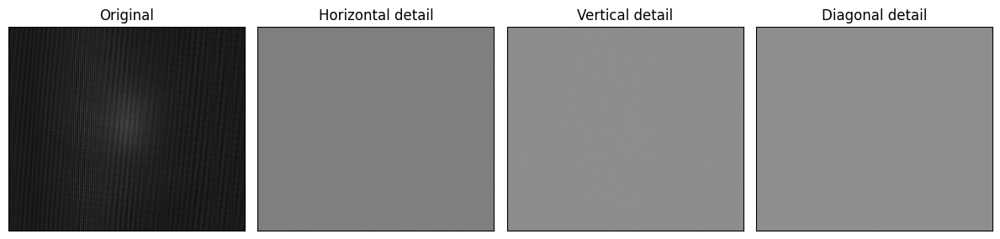

In [278]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
import imageio
# Load image
original = imageio.imread(image_name)
# Convert the image to grayscale if it's a color image
if len(original.shape) == 3:
    original = np.dot(original[...,:3], [0.2989, 0.5870, 0.1140])
# Perform 2D discrete wavelet transform
coeffs = pywt.dwt2(original, 'bior1.3')
# Extract approximation and detail coefficients
cA, (cH, cV, cD) = coeffs
# The detail coefficients (cH, cV, cD) represent the high-frequency content of the image in the horizontal, vertical, and diagonal directions, respectively.
# Plot the original image and the detail coefficients
fig, axs = plt.subplots(1, 4, figsize=(12, 3))
# Original image
axs[0].imshow(original, cmap='gray')
axs[0].set_title('Original')
# Horizontal detail (high-frequency content in the horizontal direction)
axs[1].imshow(cH, cmap='gray')
axs[1].set_title('Horizontal detail')
# Vertical detail (high-frequency content in the vertical direction)
axs[2].imshow(cV, cmap='gray')
axs[2].set_title('Vertical detail')
# Diagonal detail (high-frequency content in the diagonal direction)
axs[3].imshow(cD, cmap='gray')
axs[3].set_title('Diagonal detail')
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

# frequency v.s. Contrast

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage, fftpack
import time

########################################
z=0.344
image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png";# Load the image of fewer laser
image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png"
########################################## ^

# Start the timer
start_time = time.time()
img = Image.open(image_name).convert('L')
img = np.array(img)

# Compute the Fourier transform of the image
f = fftpack.fft2(img.astype(float))
fshift = fftpack.fftshift(f)
# Define frequency bands (finer bands)
bands = [(i, i+5) for i in range(0, img.shape[1], 5)]  # x frequency bands

# Initialize list to store contrast values
contrasts = []

# Loop over frequency bands
for band in bands:
    # Create a bandpass filter
    rows, cols = img.shape
    crow, ccol = int(rows/2), int(cols/2)
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-30:crow+30, ccol-band[0]:ccol+band[0]] = 1  # only pass y frequencies in the range 0-60Hz

    # Apply the bandpass filter and compute the inverse Fourier transform
    fshift_filtered = fshift * mask
    img_back = fftpack.ifftshift(fshift_filtered)
    img_back = fftpack.ifft2(img_back)
    img_back = np.abs(img_back)

    # Compute the contrast of the filtered image
    contrast = img_back.std() / img_back.mean()
    contrasts.append(contrast)

# Plot contrast vs frequency
mid_freqs = [(band[0]+band[1])/2 for band in bands]
plt.plot(mid_freqs, contrasts)
plt.xlabel('X Frequency')
plt.ylabel('Contrast')
plt.show()

# Stop the timer
end_time = time.time()

# Compute the runtime
runtime = end_time - start_time

print('The script took', runtime, 'seconds to run.')

/var/folders/qb/z1ml4q756n396n6rdtzst_th0000gn/T/ipykernel_1144/3366359128.py:44: RuntimeWarning: invalid value encountered in scalar divide
  contrast = img_back.std() / img_back.mean()


## original code 

/var/folders/qb/z1ml4q756n396n6rdtzst_th0000gn/T/ipykernel_1711/1488183660.py:43: RuntimeWarning: invalid value encountered in scalar divide
  contrast = img_back.std() / img_back.mean()


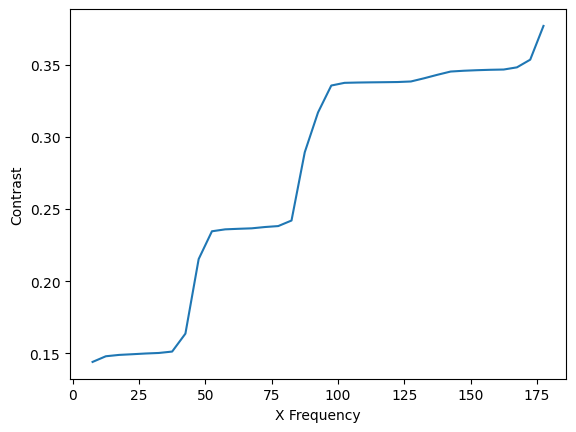

In [11]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy import fftpack
import time

########################################
z=0.344
image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png";# Load the image of fewer laser
image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png"
########################################## ^

# Start the timer
start_time = time.time()
img = Image.open(image_name).convert('L')
img = np.array(img)

# Compute the Fourier transform of the image
f = fftpack.fft2(img.astype(float))
fshift = fftpack.fftshift(f)

# Define x frequency bands with a step of 12.5 units
bands = [(i, i+5) for i in range(0, 176, 5)]  # x frequency bands

# Initialize list to store contrast values
contrasts = []

# Loop over x frequency bands
for band in bands:
    # Create a bandpass filter that only passes y frequencies within a certain range
    rows, cols = img.shape
    crow, ccol = int(rows/2), int(cols/2)
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-60:crow+60, ccol-band[0]:ccol+band[0]] = 1  # only pass y frequencies within a certain range

    # Apply the bandpass filter and compute the inverse Fourier transform
    fshift_filtered = fshift * mask
    img_back = fftpack.ifftshift(fshift_filtered)
    img_back = fftpack.ifft2(img_back)
    img_back = np.abs(img_back)

    # Compute the contrast of the filtered image
    contrast = img_back.std() / img_back.mean()
    # contrast = img_back.std() 

    contrasts.append(contrast)

# Plot contrast vs x frequency
mid_freqs = [(band[0]+band[1])/2 for band in bands]
plt.plot(mid_freqs, contrasts)
plt.xlabel('X Frequency')
plt.ylabel('Contrast')
plt.show()

## debugged, anything wrong with fft in this code

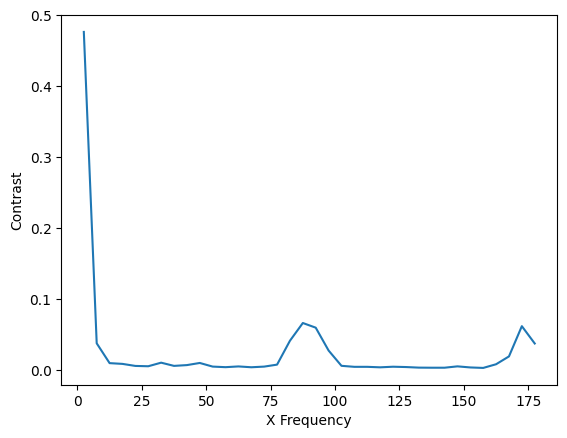

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy import fftpack


########################################
z=0.344
image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png";# Load the image of fewer laser
image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png"
########################################

# Start the timer
img = Image.open(image_name2).convert('L')
img = np.array(img)

# Compute the Fourier transform of the image
f = fftpack.fft2(img.astype(float))

# Define x frequency bands with a step of 5 units
bands = [(i, i+5) for i in range(0, 176, 5)]  # x frequency bands

# Initialize list to store contrast values
contrasts = []
intensitys= []
# Loop over x frequency bands
for band in bands:
    # Create a bandpass filter that only passes y frequencies within a certain range
    rows, cols = img.shape
    crow, ccol = int(rows/2), int(cols/2)
    mask = np.zeros((rows, cols), np.uint8)
    mask[0:60, band[0]:band[1]] = 1  # only pass y frequencies within a certain range

    # Apply the bandpass filter and compute the inverse Fourier transform
    f_filtered = f * mask
    img_back = fftpack.ifft2(f_filtered)
    img_back = np.abs(img_back)

    # Compute the intensity of the x frequency
    intensity = np.sum(np.abs(f_filtered))
    intensitys.append(intensity)
    # Compute the contrast of the filtered image, weighted by the intensity
    #contrast = (img_back * intensity).std() / (img_back.mean() + 1e-8)
    #contrast = img_back.std() / img_back.mean()
    contrast = img_back.std()
    contrasts.append(contrast)

# Plot contrast vs x frequency
mid_freqs = [(band[0]+band[1])/2 for band in bands]
plt.plot(mid_freqs, contrasts)
plt.xlabel('X Frequency')
plt.ylabel('Contrast')

plt.show()


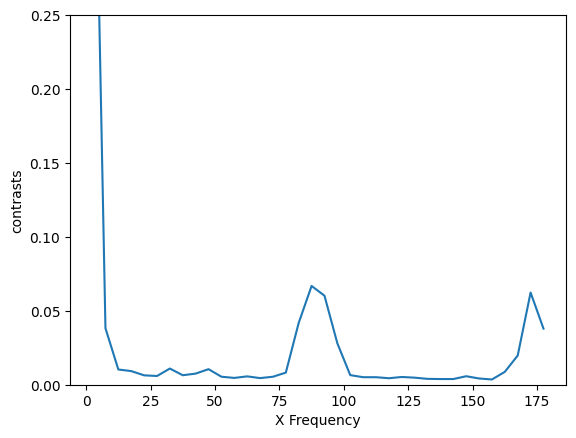

In [33]:
# Plot contrast vs x frequency
mid_freqs = [(band[0]+band[1])/2 for band in bands]
plt.plot(mid_freqs, contrasts)
plt.xlabel('X Frequency')
plt.ylabel('contrasts')
plt.ylim(0,0.25)
plt.show()

## f v.s. PSD

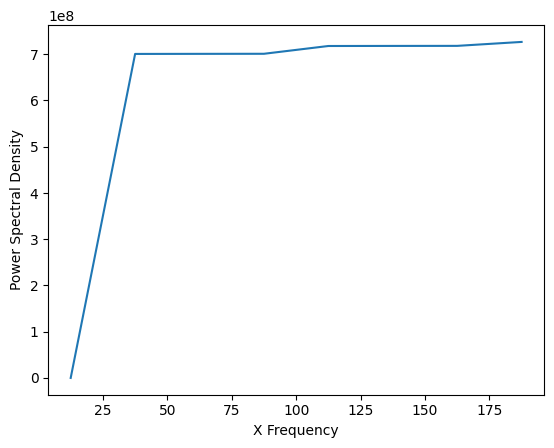

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy import fftpack
import time

########################################
z=0.344
image_name="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png";# Load the image of fewer laser
image_name2="/Users/qingjunwang/Documents/code/python/data_multisource/8um test 1.1 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z"+str(z)+"_Exp23960.png"
########################################## ^

# Load the image and convert to grayscale
img = Image.open(image_name2).convert('L')
img = np.array(img)

# Compute the Fourier transform of the image
f = fftpack.fft2(img.astype(float))
fshift = fftpack.fftshift(f)

# Define x frequency bands with a step of 25 units
bands = [(i, i+25) for i in range(0, 176, 25)]  # x frequency bands

# Initialize list to store PSD values
psds = []

# Loop over x frequency bands
for band in bands:
    # Create a bandpass filter that only passes y frequencies within a certain range
    rows, cols = img.shape
    crow, ccol = int(rows/2), int(cols/2)
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-30:crow+30, ccol-band[0]:ccol+band[0]] = 1  # only pass y frequencies within a certain range

    # Apply the bandpass filter and compute the inverse Fourier transform
    fshift_filtered = fshift * mask
    img_back = fftpack.ifftshift(fshift_filtered)
    img_back = fftpack.ifft2(img_back)
    img_back = np.abs(img_back)

    # Compute the power spectral density of the filtered image
    psd = np.mean(np.abs(fshift_filtered)**2)
    psds.append(psd)

# Plot PSD vs x frequency
mid_freqs = [(band[0]+band[1])/2 for band in bands]
plt.plot(mid_freqs, psds)
plt.xlabel('X Frequency')
plt.ylabel('Power Spectral Density')
plt.show()

# Grain size

In [131]:
path='/Users/qingjunwang/Documents/code/python/grain_size/'
file='image1.png'
file='1-1190696x63.jpeg'
#file='main-qimg-1df2c5947837643c84da80282318fb94.gif'
name=path+file

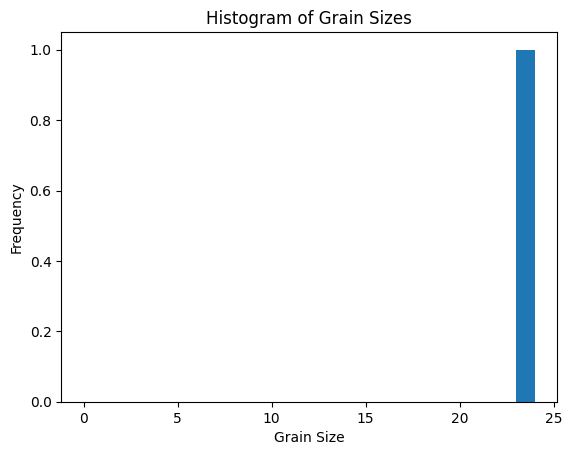

Mean grain size:  150.52
Median grain size:  134.0


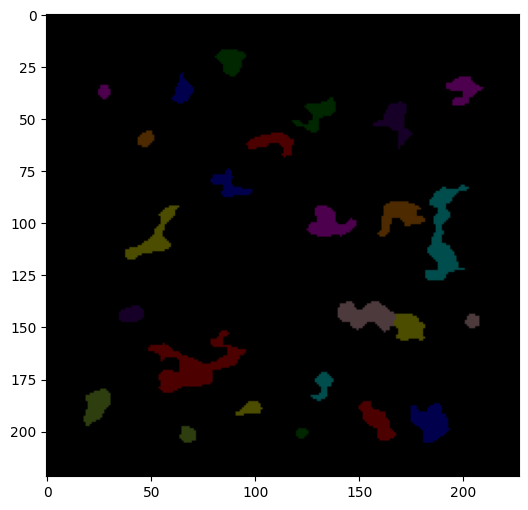

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import img_as_ubyte
from skimage.color import label2rgb
from skimage.measure import label, regionprops
from skimage.morphology import closing, square, remove_small_objects
from skimage.segmentation import clear_border, watershed
from skimage.feature import peak_local_max
from skimage.filters import threshold_otsu
from scipy import ndimage as ndi

# Load the image and convert it to grayscale
img = plt.imread(name)
img = img[:, :, 0] / 255.0

# Apply a threshold to the image to get a binary image
thresh = threshold_otsu(img)
binary = img > thresh

# Perform a morphological closing operation to remove small holes in the grains
binary = closing(binary, square(3))

# Remove small objects that are not grains
binary = remove_small_objects(binary, 2)

# Clear objects touching the border
binary = clear_border(binary)

# Label the grains in the binary image
labels = label(binary)

# Compute the distance transform of the binary image
distance = ndi.distance_transform_edt(binary)

# Find the local maxima of the distance transform
coordinates = peak_local_max(distance, min_distance=20, labels=binary)

# Create an array of markers at the local maxima
markers = np.zeros_like(img, dtype=int)
markers[tuple(coordinates.T)] = np.arange(len(coordinates)) + 1

# Apply the watershed algorithm to the distance transform using the markers
labels = watershed(-distance, markers, mask=binary)

# Compute the size of each grain in the image
grain_sizes = [np.sum(labels == i) for i in range(1, np.max(labels)+1)]

# Plot the histogram of grain sizes
plt.hist(grain_sizes, bins=range(len(grain_sizes)))
plt.xlabel('Grain Size')
plt.ylabel('Frequency')
plt.title('Histogram of Grain Sizes')
plt.show()

print('Mean grain size: ', np.mean(grain_sizes))
print('Median grain size: ', np.median(grain_sizes))

# Display the labeled regions in the image
image_label_overlay = label2rgb(labels, image=img)
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)
plt.show()

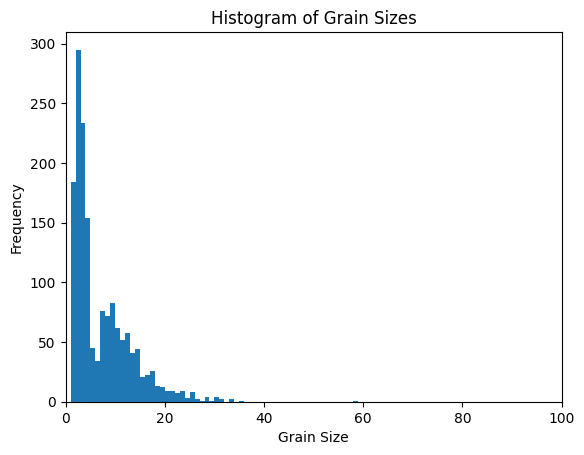

min grain size:  1
Median grain size:  4.0


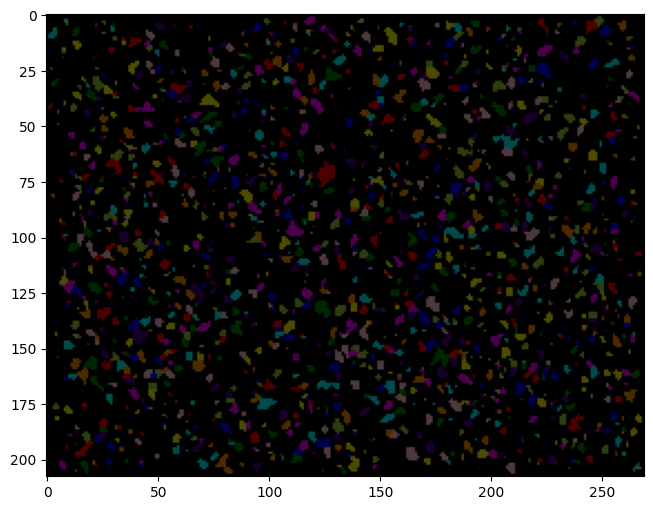

In [129]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import img_as_ubyte
from skimage.color import label2rgb
from skimage.measure import label, regionprops
from skimage.morphology import closing, square, remove_small_objects
from skimage.segmentation import clear_border, watershed
from skimage.feature import peak_local_max
from skimage.filters import threshold_otsu
from scipy import ndimage as ndi

# Load the image and convert it to grayscale
img = plt.imread(name)
img = img[:, :, 0] / 255.0

# Apply a threshold to the image to get a binary image
thresh = threshold_otsu(img)
binary = img > thresh

# # Perform a morphological closing operation to remove small holes in the grains
# binary = closing(binary, square(3))
# # Remove small objects that are not grains
# binary = remove_small_objects(binary, 20)
# Clear objects touching the border
binary = clear_border(binary)

# Label the grains in the binary image
labels = label(binary)

# Compute the distance transform of the binary image
distance = ndi.distance_transform_edt(binary)

grain_size=2
# Find the local maxima of the distance transform
coordinates = peak_local_max(distance, min_distance=grain_size, labels=binary)

# Create an array of markers at the local maxima
markers = np.zeros_like(img, dtype=int)
markers[tuple(coordinates.T)] = np.arange(len(coordinates)) + 1

# Apply the watershed algorithm to the distance transform using the markers
labels = watershed(-distance, markers, mask=binary)

# Compute the size of each grain in the image
grain_sizes = [np.sum(labels == i) for i in range(1, np.max(labels)+1)]

# Plot the histogram of grain sizes
plt.hist(grain_sizes, bins=range(len(grain_sizes)))
plt.xlabel('Grain Size')
plt.ylabel('Frequency')
plt.title('Histogram of Grain Sizes')
plt.xlim([0,100])
plt.show()

print('min grain size: ', np.min(grain_sizes))
print('Median grain size: ', np.median(grain_sizes))

# Display the labeled regions in the image
image_label_overlay = label2rgb(labels, image=img)
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)
plt.show()


# 8um sample test 2

## show image1-3, sum

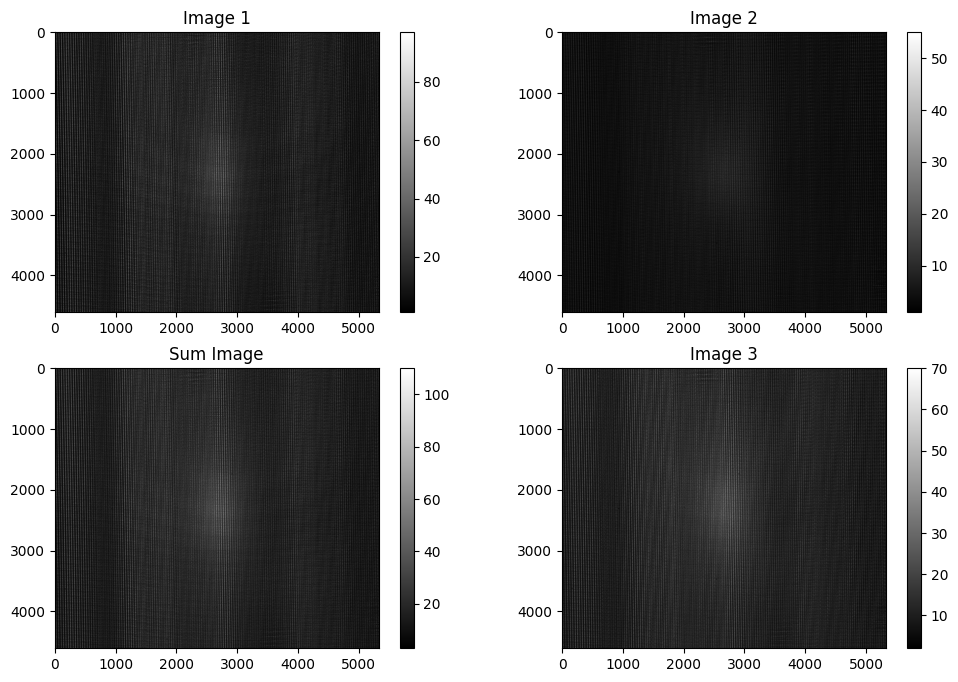

In [132]:
import numpy as np    
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageEnhance
from skimage import io
from skimage.util import view_as_blocks

# Load the images
z=0.394
image1 = Image.open("/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-R1ON_X0.000_Y0.000_Z0.218_Exp52411.png").convert('L')
image2 = Image.open("/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-R2ON_X0.000_Y0.000_Z0.218_Exp52411.png").convert('L')
image3 = Image.open("/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z0.243_Exp52411.png").convert('L')
#image 1 R1ON start at 0.069 
#image 2 R2ON start at 0.069 
#image 3 is the R1R2ON start at 0.093

# Create a Brightness enhancer
enhancer = ImageEnhance.Brightness(image1)
# Increase the brightness by a factor of 2
brighter_image1 = enhancer.enhance(1)
# Create a Brightness enhancer
enhancer = ImageEnhance.Brightness(image2)
# Increase the brightness by a factor of 2
brighter_image2 = enhancer.enhance(2)
# Create a Brightness enhancer
enhancer = ImageEnhance.Brightness(image3)
# Increase the brightness by a factor of 2
brighter_image3 = enhancer.enhance(1)


array1 = np.array(image1)
array2 = np.array(image2)
array2bright= np.array(brighter_image2)
array3 = np.array(image3)

# Perform the summation
sum_array = array1 + array2
# Convert the result back to an image
# sum_image = Image.fromarray(sum_array)
# Create a new figure
plt.figure(figsize=(12, 8))
# Display image1
plt.subplot(2, 2, 1)
plt.imshow(image1, cmap='gray')
plt.colorbar()
plt.title('Image 1')
# Display image2
plt.subplot(2, 2, 2)
plt.imshow(array2, cmap='gray')
plt.colorbar()
plt.title('Image 2')
# plt.subplot(3, 2, 3)
# plt.imshow(brighter_image1, cmap='gray')
# plt.title('bright Image 1')
# # Display image2
# plt.subplot(3, 2, 4)
# plt.imshow(brighter_image2, cmap='gray')
# plt.title('bright Image 2')
# Display sum_image
plt.subplot(2, 2, 3)
plt.imshow(sum_array, cmap='gray')
plt.colorbar()
plt.title('Sum Image')
# Display image3
plt.subplot(2, 2, 4)
plt.imshow(image3, cmap='gray')
plt.colorbar()
plt.title('Image 3')
# Show the figure
plt.show()


## fft image 1-3,sum

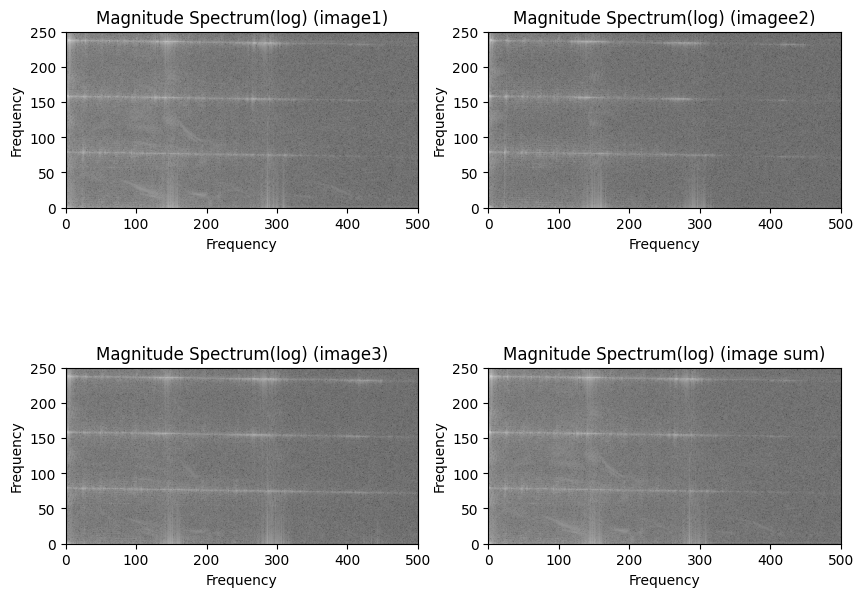

In [133]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

f_range=500;
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(fft_array_input(image1), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (image1)')

plt.subplot(2, 2, 2)
plt.imshow(fft_array_input(image2), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (image2)')

plt.subplot(2, 2, 3)
plt.imshow(fft_array_input(image3), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (image3)')

plt.subplot(2, 2, 4)
plt.imshow(fft_array_input(sum_array), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (image sum)')
plt.show()



## bin image 1-3,sum

Text(0.5, 1.0, 'Sum Image')

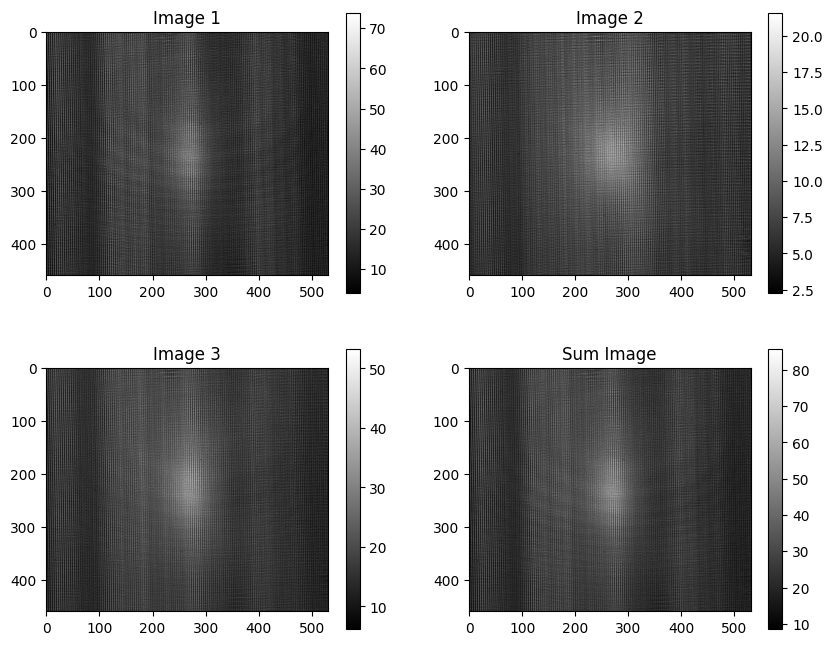

In [126]:
from skimage import io
import numpy as np
from skimage.util import view_as_blocks
# Load the images
image1 = "/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-R1ON_X0.000_Y0.000_Z0.218_Exp52411.png"
image2 = "/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-R2ON_X0.000_Y0.000_Z0.218_Exp52411.png"
image3 = "/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_DoubleInjection-ZScan-R1R2ON_X0.000_Y0.000_Z0.243_Exp52411.png"
#image 1 R1ON start at 0.069 
#image 2 R2ON start at 0.069 
image1 = io.imread(image1)
image2 = io.imread(image2)
image3 = io.imread(image3)
block_size = (10, 10)
#(4608, 5328, 3)
# Convert the image to a numpy array
array1 = np.array(image1)
array1 = image1[:, :, 1]
array1_cropped = array1[:4590,:5310]  # This will give you a 5310x4590 image
binned_array1 = np.mean(view_as_blocks(array1_cropped, block_size), axis=(-1, -2))

array2 = np.array(image2)
array2 = image2[:, :, 1]
array2_cropped = array2[:4590,:5310]  # This will give you a 5310x4590 image
binned_array2 = np.mean(view_as_blocks(array2_cropped, block_size), axis=(-1, -2))

array3 = np.array(image3)
array3 = image3[:, :, 1]
array3_cropped = array3[:4590,:5310]  # This will give you a 5310x4590 image
binned_array3 = np.mean(view_as_blocks(array3_cropped, block_size), axis=(-1, -2))

plt.figure(figsize=(10, 8))
# Display image1
plt.subplot(2, 2, 1)
# Display the binned image
plt.imshow(binned_array1, cmap='gray')
plt.colorbar()
plt.title('Image 1')

plt.subplot(2, 2, 2)
# Display the binned image
plt.imshow(binned_array2, cmap='gray')
plt.colorbar()
plt.title('Image 2')

plt.subplot(2, 2, 3)
# Display the binned image
plt.imshow(binned_array3, cmap='gray')
plt.colorbar()
plt.title('Image 3')

plt.subplot(2, 2, 4)
# Perform the summation
sum_binned_array = binned_array1 + binned_array2
plt.imshow(sum_binned_array, cmap='gray')
plt.colorbar()
plt.title('Sum Image')

## fft of bined image1-3,sum

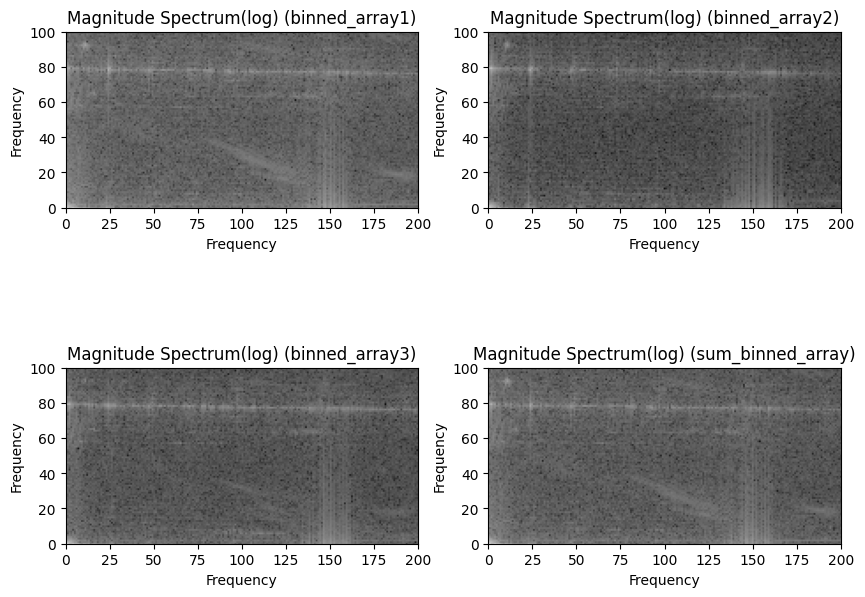

In [131]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

f_range=200;
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(fft_array_input(binned_array1), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (binned_array1)')

plt.subplot(2, 2, 2)
plt.imshow(fft_array_input(binned_array2), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (binned_array2)')

plt.subplot(2, 2, 3)
plt.imshow(fft_array_input(binned_array3), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (binned_array3)')

plt.subplot(2, 2, 4)
plt.imshow(fft_array_input(sum_binned_array), cmap='gray',aspect=1)
plt.xlabel('Frequency') # plt.xlim([480,520]) # plt.ylim([480,520])
plt.xlim([-0, f_range])
plt.ylim([-0, f_range/2])
plt.ylabel('Frequency')
plt.title('Magnitude Spectrum(log) (sum_binned_array)')
plt.show()



### analysis the difference

In [103]:
from skimage.metrics import structural_similarity as ssim
data_range = max(binned_array1.max(), sum_binned_array.max()) - min(binned_array1.min(), sum_binned_array.min())
score, diff = ssim(binned_array3, sum_binned_array, full=True, data_range=data_range)
print(f'SSIM: {score}')

SSIM: 0.6953702156808671


In [138]:
from skimage.metrics import structural_similarity as ssim
data_range = max(binned_array1.max(), sum_binned_array.max()) - min(binned_array1.min(), sum_binned_array.min())
score, diff = ssim(binned_array2,binned_array3, full=True, data_range=data_range)
print(f'SSIM: {score}')

SSIM: 0.425286922695505


In [139]:
from skimage.metrics import structural_similarity as ssim
data_range = max(binned_array1.max(), sum_binned_array.max()) - min(binned_array1.min(), sum_binned_array.min())
score, diff = ssim(binned_array2, sum_binned_array, full=True, data_range=data_range)
print(f'SSIM: {score}')

SSIM: 0.14266150520697915


In [140]:
from skimage.metrics import structural_similarity as ssim
data_range = max(binned_array1.max(), sum_binned_array.max()) - min(binned_array1.min(), sum_binned_array.min())
score, diff = ssim(binned_array1, binned_array3, full=True, data_range=data_range)
print(f'SSIM: {score}')

SSIM: 0.46365469574056317


In [141]:
from skimage.metrics import structural_similarity as ssim
data_range = max(binned_array1.max(), sum_binned_array.max()) - min(binned_array1.min(), sum_binned_array.min())
score, diff = ssim(binned_array1, sum_binned_array, full=True, data_range=data_range)
print(f'SSIM: {score}')

SSIM: 0.9070334520247908


## shape of the image

In [133]:
from skimage import io
import numpy as np
# Load the image
image = io.imread(name)
# Convert the image to a numpy array
array = np.array(image)
# Get the dimensions of the array
height, width = array.shape[:2]
# Print the width and height of the image
print('Width:', width)
print('Height:', height)

Width: 269
Height: 208


For an RGB image, image1[:, :, 0] would represent the red channel, image1[:, :, 1] would represent the green channel, and image1[:, :, 2] would represent the blue channel.

## bin the image

(4608, 5328, 3)


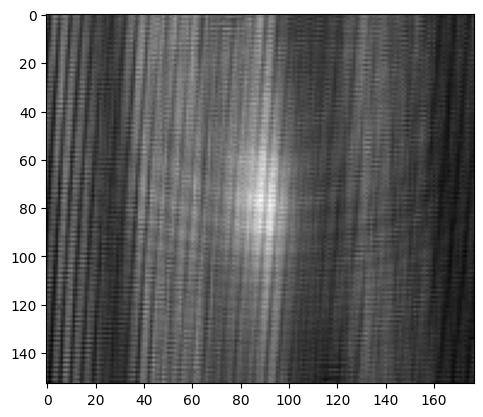

In [73]:
from skimage import io
import numpy as np
from skimage.util import view_as_blocks
# Load the image
image = io.imread("/Users/qingjunwang/Documents/code/python/data_multisource/8um test2 selection new/Dinasi-FL2_D0C0_DoubleInterleave-8um_Green_SingleInjection-ZScan-R1ON_X0.000_Y0.000_Z0.218_Exp52411.png")
# Convert the image to a numpy array
array = np.array(image)
# Print the dimensions of the array
print(array.shape)

# Convert the image to grayscale
array = image[:, :, 1]
# Crop the image to a size that is divisible by 30
array_cropped = array[:4590,:5310]  # This will give you a 5310x4590 image
# Divide the image into blocks of size (30, 30)
block_size = (30, 30)
binned_array = np.mean(view_as_blocks(array_cropped, block_size), axis=(-1, -2))
# Display the binned image
plt.imshow(binned_array, cmap='gray')
plt.show()


In [12]:
import cv2
hist1 = cv2.calcHist([array2],[0],None,[256],[0,256])
hist2 = cv2.calcHist([array3],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 0.23215726260383007


## image comparision
Structural Similarity Index (SSIM): This is a more advanced method that considers changes in structural information, luminance, and contrast. A SSIM value of -1 means the images are completely different, while a value of 1 means they are identical.

In [18]:
from skimage.metrics import structural_similarity as ssim
score, diff = ssim(array3,sum_array, full=True)
print(f'SSIM: {score}')

SSIM: 0.6630928814907232


In [19]:
from skimage.metrics import structural_similarity as ssim
score, diff = ssim(array1, sum_array, full=True)
print(f'SSIM: {score}')

SSIM: 0.9183449245156585


In [20]:
from skimage.metrics import structural_similarity as ssim
score, diff = ssim(array2, sum_array, full=True)
print(f'SSIM: {score}')

SSIM: 0.4326723581287348


In [22]:
from skimage.metrics import structural_similarity as ssim
score, diff = ssim(array2, array1, full=True)
print(f'SSIM: {score}')

SSIM: 0.5181732675662171


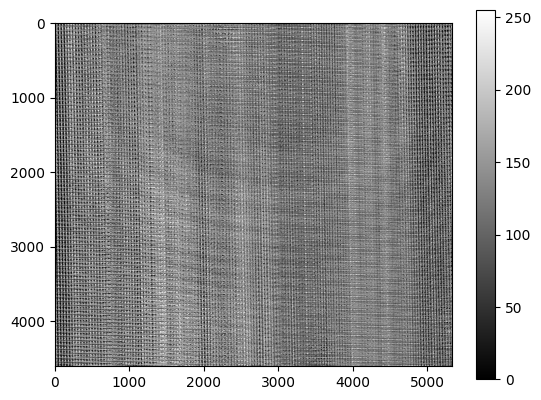

In [50]:
difference = array3- array1
plt.imshow(difference, cmap='gray')
plt.colorbar()
plt.show()

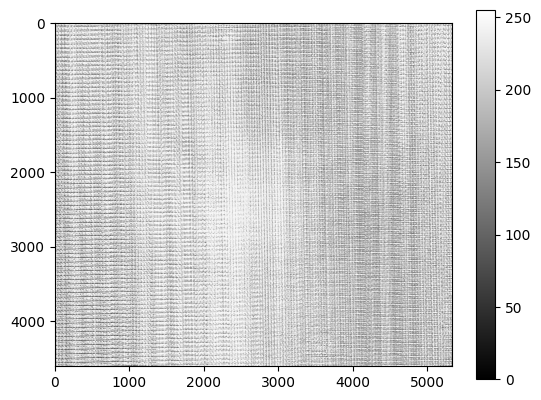

In [43]:
difference = np.abs(array3- sum_array)
plt.imshow(difference, cmap='gray')
plt.colorbar()
plt.show()

Histogram Comparison: This method compares the distribution of pixel intensities (colors) in the two images. It can be a good choice if you're interested in color or intensity distribution rather than spatial information.


In [24]:
import cv2
hist1 = cv2.calcHist([array3],[0],None,[256],[0,256])
hist2 = cv2.calcHist([sum_array],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 0.7578053635357515


In [25]:
import cv2
hist1 = cv2.calcHist([array1],[0],None,[256],[0,256])
hist2 = cv2.calcHist([sum_array],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 0.7644862394907972


In [26]:
import cv2
hist1 = cv2.calcHist([array1],[0],None,[256],[0,256])
hist2 = cv2.calcHist([array3],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 0.9514741331213485


In [27]:
import cv2
hist1 = cv2.calcHist([array2],[0],None,[256],[0,256])
hist2 = cv2.calcHist([array3],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 0.23215726260383598


In [28]:
import cv2
hist1 = cv2.calcHist([array1],[0],None,[256],[0,256])
hist2 = cv2.calcHist([array2],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 0.44089779886298186


In [16]:
import cv2
hist1 = cv2.calcHist([array2],[0],None,[256],[0,256])
hist2 = cv2.calcHist([array2],[0],None,[256],[0,256])
correl = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'Correlation: {correl}')

Correlation: 1.0
